In [1]:
import numpy as np 
import pandas as pd
from pandas.plotting import scatter_matrix
#from pandas_ta import wma, macd, stoch, adx, atr, hma, kama, cmo, zscore, qstick

import calendar
import os 
import random
import itertools

from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import seaborn as sns
import plotly.express as px

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

#from sklearn.model_selection import train_test_split

#from pgmpy.models import BayesianModel
#from pgmpy.factors.discrete import TabularCPD
#from pgmpy.inference import VariableElimination
#from pgmpy.estimators import ParameterEstimator, MaximumLikelihoodEstimator


import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import STL
#from statsmodels.stats.outliers_influence import variance_inflation_factor

from scipy.stats import pearsonr
from scipy import stats
from scipy.stats.mstats import winsorize
from scipy.signal import periodogram

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

import networkx as nx

from pandas_ta import wma, macd, stoch, adx, atr, hma, kama, cmo, zscore, qstick

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [2]:
data = pd.read_csv(
    '/Users/tobiasleva/Desktop/Datascience/ml-capstone-project/archive/crypto_data.csv')

In [59]:
data.columns

Index(['date', 'symbol', 'open', 'high', 'low', 'close', 'volume',
       'tradecount', 'token', 'hour', 'day', 'month', 'week', 'year',
       'volatility', 'hc_change', 'lc_change', 'price_change_percent'],
      dtype='object')

In [3]:
data['date'] = pd.to_datetime(data['date'], format='%Y-%m-%d %H:%M:%S')

data['month'] = data['date'].dt.month
data['week'] = data['date'].dt.isocalendar().week
data['week'] = data['week'].astype(int)
data['year'] = data['date'].dt.year

# Calculate volatility 

"volatility" refers to the degree of variation in the price over time. It is a statistical measure of the dispersion of returns and is often used as a proxy for risk. Here are some key aspects of volatility in trading:

### Measurement of Risk:
Higher volatility implies greater risk, as the price of the asset can change significantly in a short period. This can result in both potential for higher returns and higher potential for loss.

### Price Fluctuations: 
Volatility is essentially about how much the price of an asset fluctuates. Assets with high volatility experience rapid and significant price changes, while those with low volatility have more stable prices.

### Historical vs. Implied Volatility:

#### Historical Volatility: 
This refers to the volatility of a financial instrument over a past period. It is calculated using historical price data and is typically expressed as a percentage on an annualized basis.
#### Implied Volatility:
This is a forward-looking measure, derived from the price of an asset's options. It reflects the market's view of the likelihood of changes in a given asset's price.
#### Market Sentiment: 
Volatility is often influenced by market sentiment and external factors like economic indicators, geopolitical events, and company news.

### Trading Strategies
Different trading strategies are employed based on volatility. High volatility may attract traders looking for quick, large gains (often at higher risk), while low volatility might be preferred for strategies focusing on steady, incremental gains.

### Volatility Indexes:
There are indexes like the VIX (Volatility Index), which measure the market's expectation of volatility and are often referred to as the "fear index."

### Options Pricing:
Volatility is a crucial component in options pricing models like the Black-Scholes model. Higher volatility increases the premium of options.


In [4]:
data['volatility'] = (data['high'] - data['low']) / data['low'] * 100

# Close - High
This calculation gives the difference between the closing price and the highest price of the day. A negative value indicates that the closing price was lower than the day's highest price, suggesting a downward movement from the high during the day.

## Measuring Selling Pressure
A higher percentage indicates a significant decline from the high, suggesting stronger selling pressure or profit-taking during the day.

## Sentiment Analysis
It could be used as a sentiment indicator. A larger value might indicate stronger negative sentiment, as the price fell more significantly from its high during the day.

In [25]:
data['hc_change'] = (data['close'] - data['high']) / data['high'] * 100

# Close - Low

This calculates the difference between the closing price and the lowest price of the day. It measures how much the price has recovered from its lowest point during the trading session.

## Assessing Intraday Strength
This metric can indicate how strong the buying interest was after the price hit its low point of the day. A higher percentage suggests a strong recovery and possibly strong buying interest.

In [27]:
data['lc_change'] = (data['close'] - data['low']) / data['low'] * 100

# Change of 'close' over hours 
claculate the change of the close from row to row by 

(close_day0 - close_day-1)/close_day-1

In [37]:
data = data.sort_values(by=['token', 'date'])
data['price_change_percent'] = (data.groupby(
                        'token')['close'].pct_change() * 100).round(2)

In [38]:
data.rename(columns={'volume usdt': 'volume'}, inplace=True)

In [39]:
nan_values = data.isna()
any_missing_values = nan_values.any().any()

any_missing_values_in_column = nan_values.any()

missing_value_count = data.isnull().sum()

for column, has_missing in any_missing_values_in_column.items():
    if has_missing:
        count = missing_value_count[column]
        print(f"-----> Column '{column}' has {count} missing values.")
        
print("\nMissing Values in the Entire DataFrame?")
print(any_missing_values)

print("\nMissing Values in Each Column?")
print(any_missing_values_in_column)

print("\nMissing Value Counts in Each Column:")
print(missing_value_count)

-----> Column 'price_change_percent' has 32 missing values.

Missing Values in the Entire DataFrame?
True

Missing Values in Each Column?
date                    False
symbol                  False
open                    False
high                    False
low                     False
close                   False
volume                  False
tradecount              False
token                   False
hour                    False
day                     False
month                   False
week                    False
year                    False
volatility              False
hc_change               False
lc_change               False
price_change_percent     True
dtype: bool

Missing Value Counts in Each Column:
date                     0
symbol                   0
open                     0
high                     0
low                      0
close                    0
volume                   0
tradecount               0
token                    0
hour                     0
da

In [41]:
# each unique token has NaN as its first value in the
# price_change_percent column 

un_token = data['token'].nunique()
un_token

32

In [43]:
data['price_change_percent'] = data.groupby(
    'token')['price_change_percent'].fillna(0)

In [44]:
data_df = data.copy(deep=True)
df = data.copy(deep=True)
df2 = data.copy(deep=True)
df3 = data.copy(deep=True)
#btc_check = data[(data['token'] == 'BTC')]

In [45]:
u_token = df['token'].unique()
u_token

array(['1INCH', 'AAVE', 'ADA', 'ALGO', 'ATOM', 'AVAX', 'BAL', 'BCH',
       'BNB', 'BTC', 'COMP', 'CRV', 'DENT', 'DOGE', 'DOT', 'DYDX', 'ETC',
       'ETH', 'FIL', 'HBAR', 'ICP', 'LINK', 'LTC', 'MATIC', 'MKR', 'RVN',
       'SHIB', 'SOL', 'SUSHI', 'TRX', 'UNI', 'XMR'], dtype=object)

In [52]:
# get the total number of occurances of token, days, hours and month in 
# dataset

t_counts = df['token'].value_counts()
tc_df = t_counts.reset_index()
tc_df.columns = ['token', 'count']
tc_df = tc_df.sort_values(by='count', ascending=False)


d_counts = df['day'].value_counts()
d_df = d_counts.reset_index()
d_df.columns = ['day', 'count']
d_df = d_df.sort_values(by='count', ascending=False)

h_counts = df['hour'].value_counts()
h_df = h_counts.reset_index()
h_df.columns = ['hour', 'count']
h_df = h_df.sort_values(by='count', ascending=False)

m_counts = df['month'].value_counts()
m_df = m_counts.reset_index()
m_df.columns = ['Month', 'count']
m_df = m_df.sort_values(by='count', ascending=False)

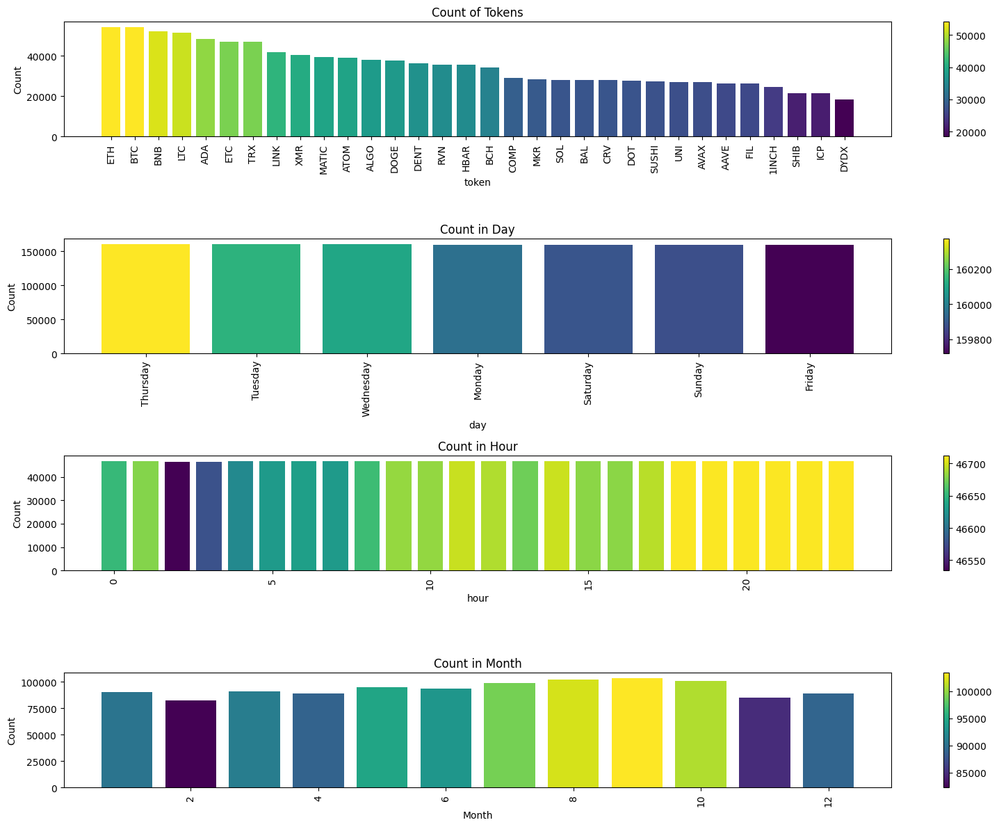

In [53]:
import matplotlib as mpl

fig, axs = plt.subplots(4, 1, figsize=(16, 12)) 

for i, (df, title) in enumerate([(tc_df, 'Count of Tokens'),
                                (d_df, 'Count in Day'),
                                (h_df, 'Count in Hour'),
                                (m_df, 'Count in Month')]):
    colormap = plt.cm.get_cmap('viridis')
    norm = mpl.colors.Normalize(vmin=df['count'].min(), vmax=df['count'].max())

    bars = axs[i].bar(df[df.columns[0]], df['count'], color=colormap(norm(df['count'])))
    
    axs[i].set_xlabel(df.columns[0])
    axs[i].set_ylabel('Count')
    axs[i].set_title(title)
    axs[i].tick_params(axis='x', rotation=90)

    sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=axs[i])

plt.tight_layout() 
plt.show()

In [55]:
df2['symbol'] = label_encoder.fit_transform(df2['symbol'])

In [57]:

# One-hot encosing might be better suited here needs to be implemented 

day_mapping = {
    'Monday': 0,
    'Tuesday': 1,
    'Wednesday': 2,
    'Thursday': 3,
    'Friday': 4,
    'Saturday': 5,
    'Sunday': 6
}

df2['day'] = df2['day'].map(day_mapping)

In [60]:
#scat_filt = ['date', 'volume', 'tradecount', 'hour', 'day', 'month', 'volatility', 'week']
scat_filt = ['hour', 'day', 'week', 'month', 'volatility', 'tradecount', 'volume']

#btc_scat = df2[(df2['token'] == 'BTC') & (df2['year'] == 2020)]
btc_scat = df2[(df2['token'] == 'BTC')]

btc_scat = btc_scat[scat_filt]

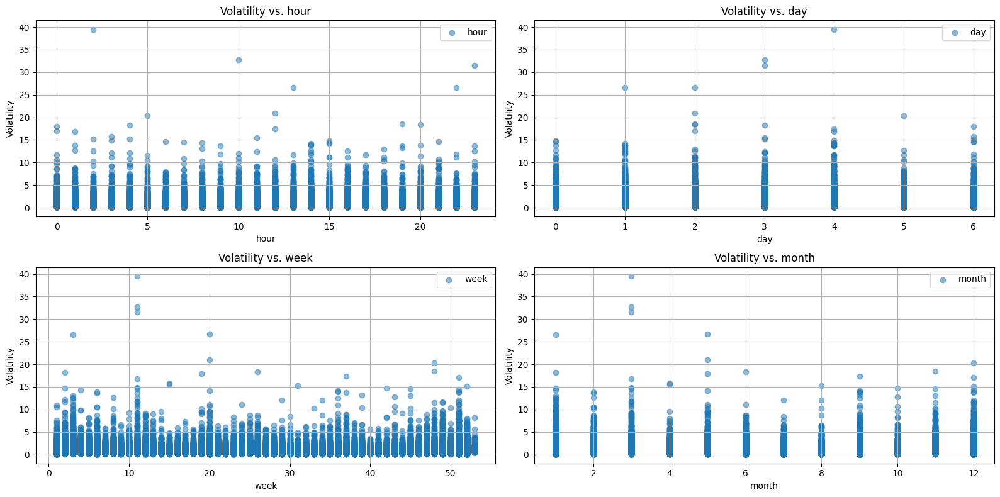

In [61]:
scatter_columns = ['hour', 'day', 'week', 'month']

num_rows = len(scatter_columns) // 2 + (len(scatter_columns) % 2 > 0)

fig, axes = plt.subplots(num_rows, 2, figsize=(8 * 2, 4 * num_rows))

for i, column in enumerate(scatter_columns):
    plt.subplot(num_rows, 2, i + 1)
    plt.scatter(btc_scat[column], btc_scat['volatility'], label=column, alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('Volatility')
    plt.title(f"Volatility vs. {column}")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [64]:
percentile_threshold = 99.5
percentile_value = np.percentile(btc_scat['volatility'], percentile_threshold)
btc_scat = btc_scat[btc_scat['volatility'] <= percentile_value]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


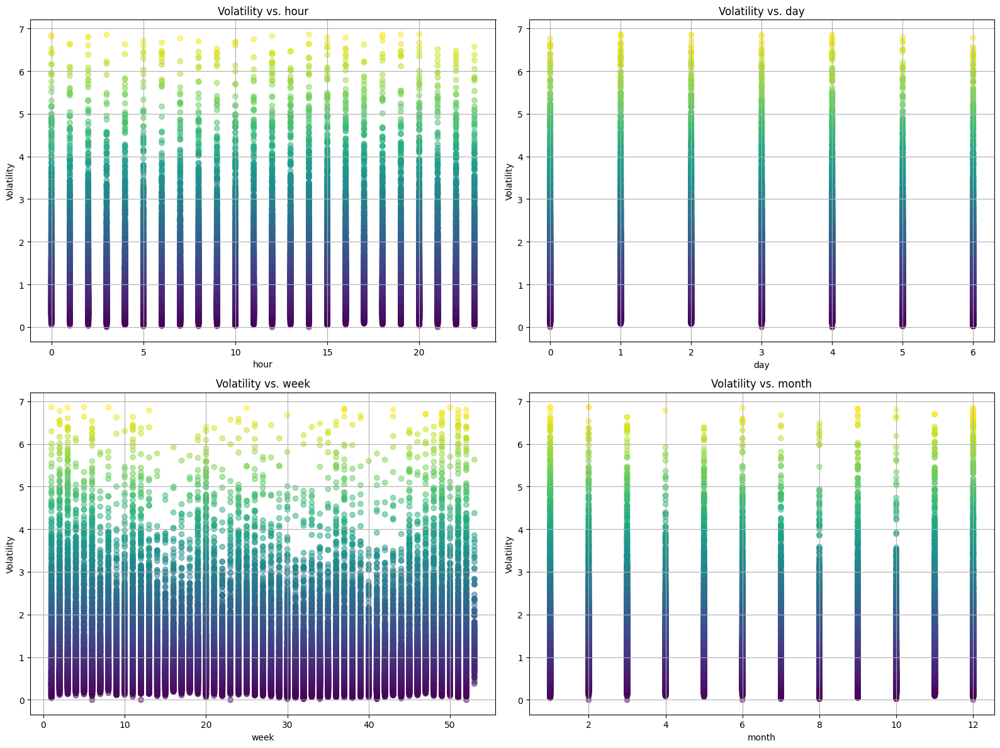

In [65]:
scatter_columns = ['hour', 'day', 'week', 'month']

num_rows = len(scatter_columns) // 2 + (len(scatter_columns) % 2 > 0)

fig, axes = plt.subplots(num_rows, 2, figsize=(8 * 2, 6 * num_rows))

for i, column in enumerate(scatter_columns):
    plt.subplot(num_rows, 2, i + 1)

    colors = btc_scat['volatility']
    
    plt.scatter(btc_scat[column], btc_scat['volatility'], c=colors, cmap=cm.viridis, alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('Volatility')
    plt.title(f"Volatility vs. {column}")
    plt.legend().set_visible(False)
    plt.grid(True)

plt.tight_layout()
plt.show()

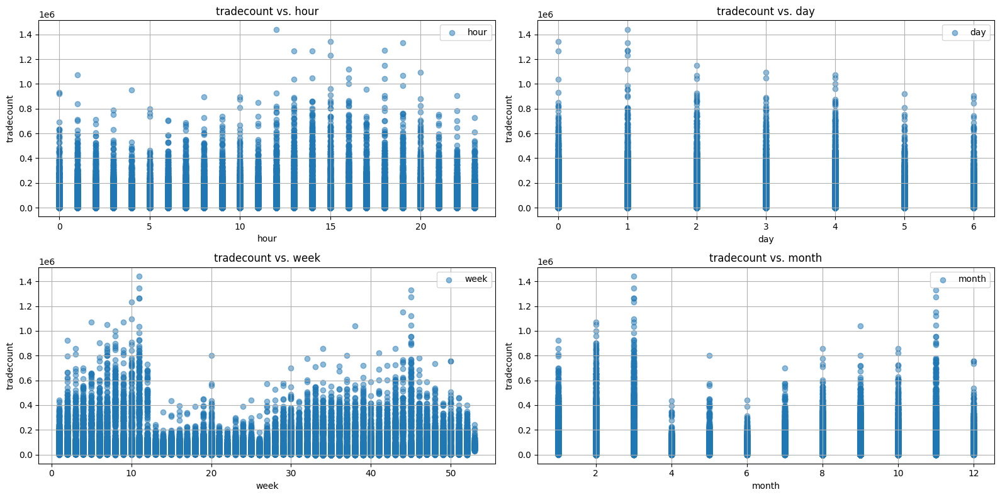

In [62]:
scatter_columns = ['hour', 'day', 'week', 'month']

num_rows = len(scatter_columns) // 2 + (len(scatter_columns) % 2 > 0)

fig, axes = plt.subplots(num_rows, 2, figsize=(8 * 2, 4 * num_rows))

for i, column in enumerate(scatter_columns):
    plt.subplot(num_rows, 2, i + 1)
    plt.scatter(btc_scat[column], btc_scat['tradecount'], label=column, alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('tradecount')
    plt.title(f"tradecount vs. {column}")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [66]:
percentile_threshold = 99.5
percentile_value = np.percentile(btc_scat['tradecount'], percentile_threshold)
btc_scat = btc_scat[btc_scat['tradecount'] <= percentile_value]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


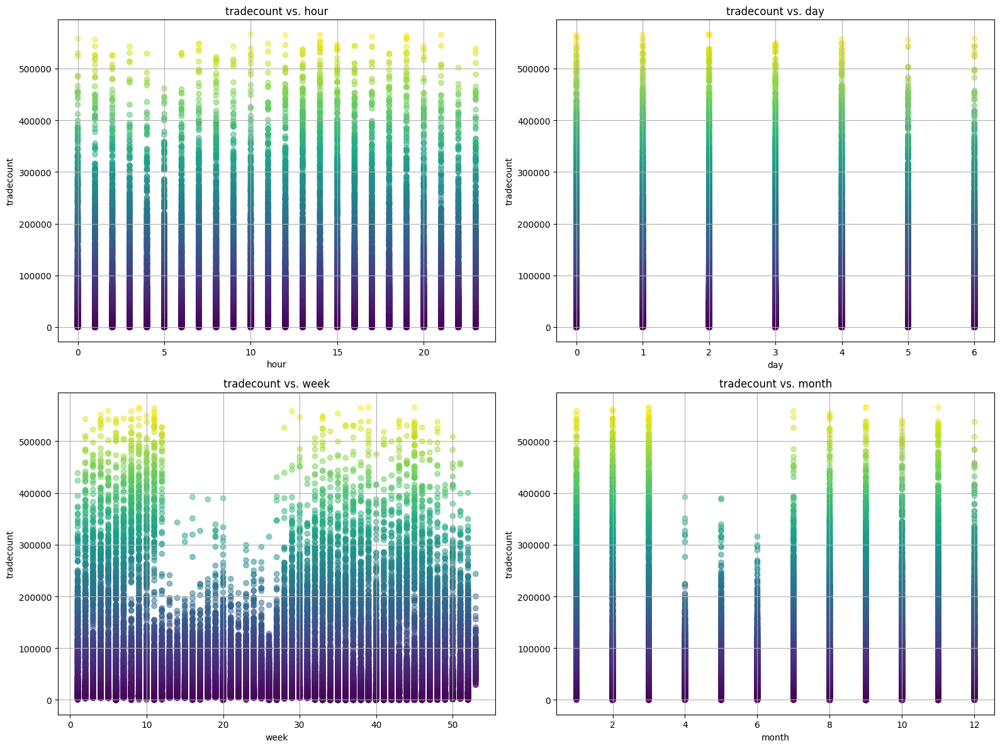

In [67]:
scatter_columns = ['hour', 'day', 'week', 'month']

num_rows = len(scatter_columns) // 2 + (len(scatter_columns) % 2 > 0)

fig, axes = plt.subplots(num_rows, 2, figsize=(8 * 2, 6 * num_rows))

for i, column in enumerate(scatter_columns):
    plt.subplot(num_rows, 2, i + 1)

    colors = btc_scat['tradecount']
    
    plt.scatter(btc_scat[column], btc_scat['tradecount'], c=colors, cmap=cm.viridis, alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('tradecount')
    plt.title(f"tradecount vs. {column}")
    plt.legend().set_visible(False)
    plt.grid(True)

plt.tight_layout()
plt.show()

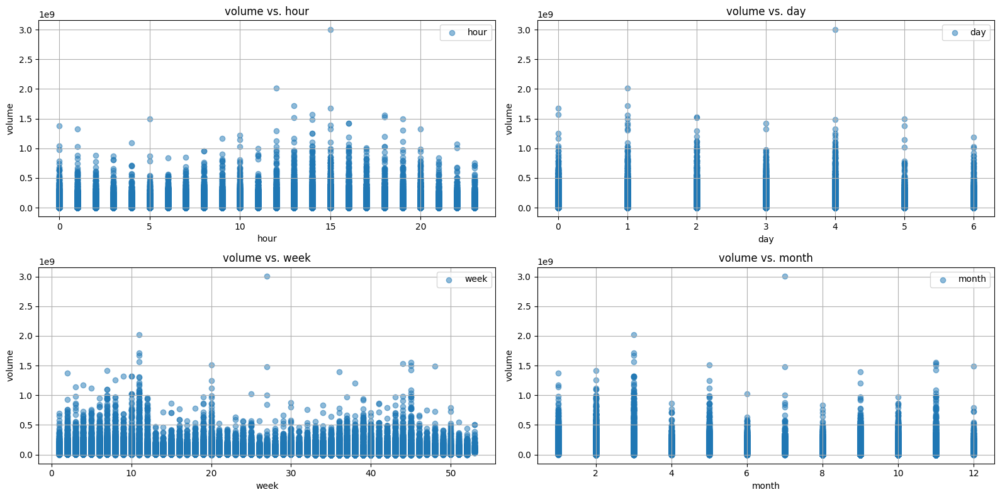

In [63]:
scatter_columns = ['hour', 'day', 'week', 'month']

num_rows = len(scatter_columns) // 2 + (len(scatter_columns) % 2 > 0)

fig, axes = plt.subplots(num_rows, 2, figsize=(8 * 2, 4 * num_rows))

for i, column in enumerate(scatter_columns):
    plt.subplot(num_rows, 2, i + 1)
    plt.scatter(btc_scat[column], btc_scat['volume'], label=column, alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('volume')
    plt.title(f"volume vs. {column}")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [68]:
btc_df = df2[df2['token'] == 'BTC']

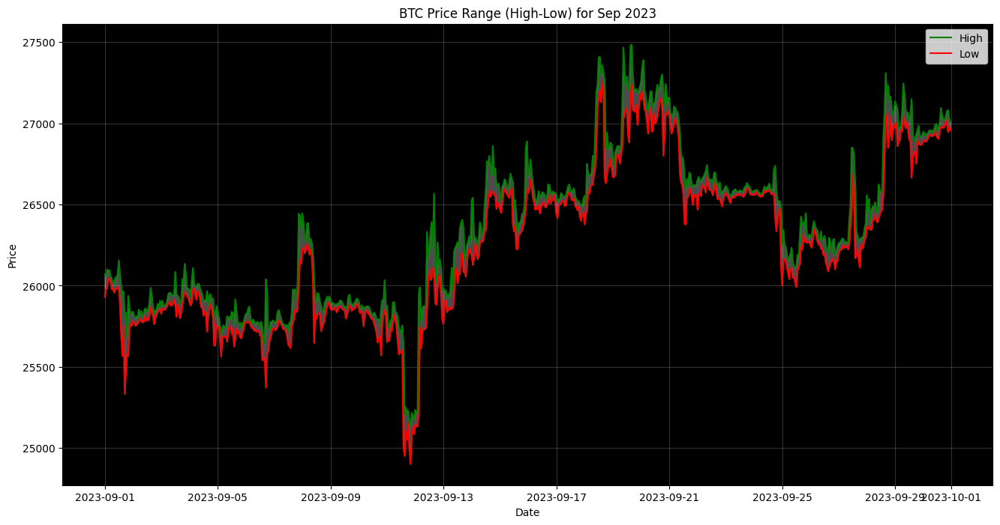

In [69]:
btc_df_2023_october = btc_df[(btc_df['date'].dt.year == 2023) 
                             & (btc_df['date'].dt.month == 9)]

dates = btc_df_2023_october['date']
open_prices = btc_df_2023_october['open']
high_prices = btc_df_2023_october['high']
low_prices = btc_df_2023_october['low']

plt.figure(figsize=(16, 8))
plt.gca().set_facecolor('black')

plt.plot(dates, high_prices, label='High', color='green')
plt.plot(dates, low_prices, label='Low', color='red')

plt.fill_between(dates, low_prices, high_prices,
                 where=(high_prices > low_prices),
                 alpha=0.3, color='white')

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('BTC Price Range (High-Low) for Sep 2023')
plt.legend()

plt.grid(color='white', alpha=0.2)
plt.show()

<IPython.core.display.Javascript object>


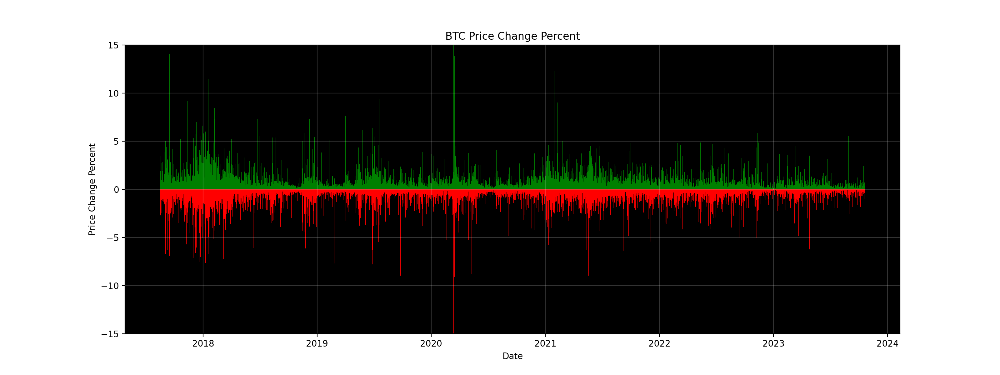

In [70]:
%matplotlib notebook
price_change_percent = btc_df['price_change_percent']

plt.figure(figsize=(16, 6))
plt.gca().set_facecolor('black')
bars = plt.bar(btc_df['date'], price_change_percent, color=['g' if p >= 0 else 'r' for p in price_change_percent])
plt.ylim(-15, 15)

plt.xlabel('Date')
plt.ylabel('Price Change Percent')
plt.title('BTC Price Change Percent')

plt.grid(color='white', alpha=0.2)

plt.show()

In [71]:
%matplotlib inline

In [72]:
data = data.rename(columns={'price_change_percent': 'price_change'}) 
                 
#data = data.rename(columns={'oc_percent': 'opcl_change'})  

In [86]:
df_true = data.copy(deep=True)
df = data.copy(deep=True)
df2 = data.copy(deep=True)
df3 = data.copy(deep=True)
data_df = data.copy(deep=True)

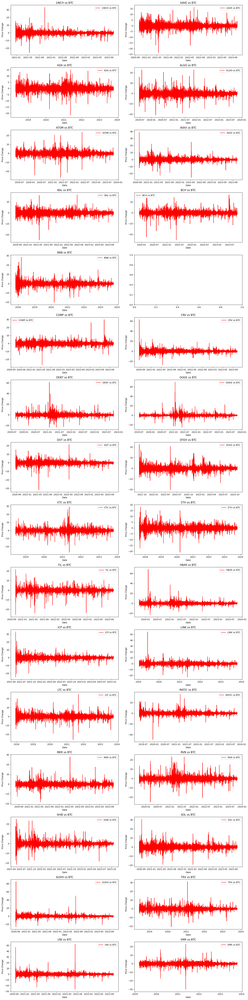

In [87]:
btc_data = df[df['token'] == 'BTC']

unique_tokens = df['token'].unique()

num_tokens = len(unique_tokens)

num_rows = num_tokens // 2 + (num_tokens % 2 > 0)
num_cols = 2

colors = ['blue' if token == 'BTC' else 'red' for token in unique_tokens]

fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows))

for i, token in enumerate(unique_tokens):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    if token == 'BTC':
        continue

    token_data = df[df['token'] == token]

    ax.plot(token_data['date'], token_data['price_change'], label=f'{token} vs BTC', color=colors[i])
    ax.set_title(f'{token} vs BTC')
    ax.set_xlabel('Date')
    ax.set_ylabel('Price Change')
    ax.legend()

# Adjust layout
plt.tight_layout()

# Show the subplots
plt.show()

In [89]:
unique_tokens

array(['1INCH', 'AAVE', 'ADA', 'ALGO', 'ATOM', 'AVAX', 'BAL', 'BCH',
       'BNB', 'COMP', 'CRV', 'DENT', 'DOGE', 'DOT', 'DYDX', 'ETC', 'ETH',
       'FIL', 'HBAR', 'ICP', 'LINK', 'LTC', 'MATIC', 'MKR', 'RVN', 'SHIB',
       'SOL', 'SUSHI', 'TRX', 'UNI', 'XMR'], dtype=object)

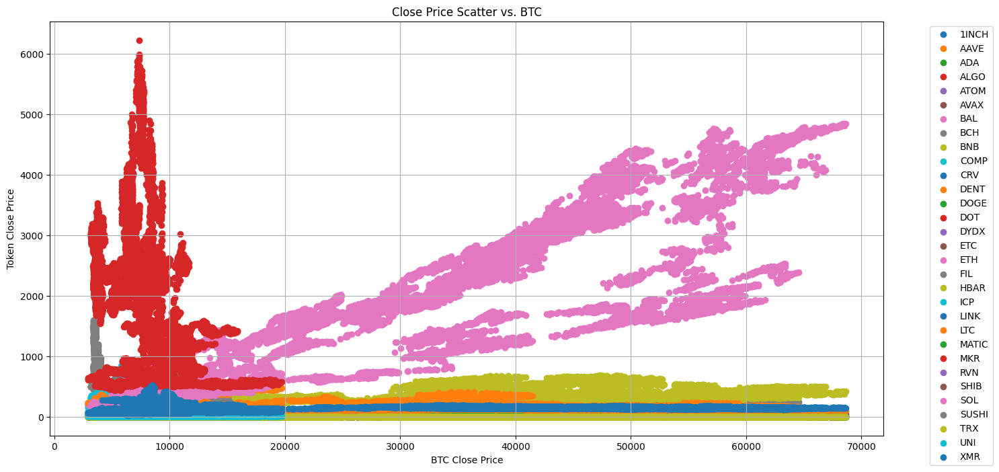

In [91]:
btc_data = df[df['token'] == 'BTC']

other_tokens_data = df[df['token'] != 'BTC']

unique_tokens = other_tokens_data['token'].unique()

plt.figure(figsize=(16, 8))

for token in unique_tokens:
#for token in ['ETH']:
    token_data = other_tokens_data[other_tokens_data['token'] == token]

    num_data_points = min(len(btc_data), len(token_data))
    
    plt.scatter(btc_data['close'][:num_data_points], token_data['close'][:num_data_points], label=token)

plt.xlabel("BTC Close Price")
plt.ylabel("Token Close Price")
plt.title("Close Price Scatter vs. BTC")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

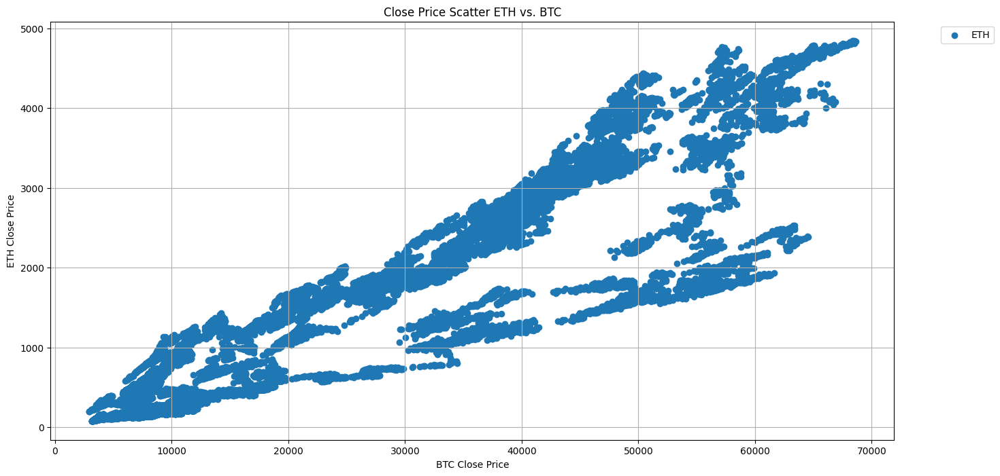

In [93]:
btc_data = df[df['token'] == 'BTC']

other_tokens_data = df[df['token'] != 'BTC']

unique_tokens = other_tokens_data['token'].unique()

plt.figure(figsize=(16, 8))

#for token in unique_tokens:
for token in ['ETH']:
    token_data = other_tokens_data[other_tokens_data['token'] == token]

    num_data_points = min(len(btc_data), len(token_data))
    
    plt.scatter(btc_data['close'][:num_data_points], token_data['close'][:num_data_points], label=token)

plt.xlabel("BTC Close Price")
plt.ylabel("ETH Close Price")
plt.title("Close Price Scatter ETH vs. BTC")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

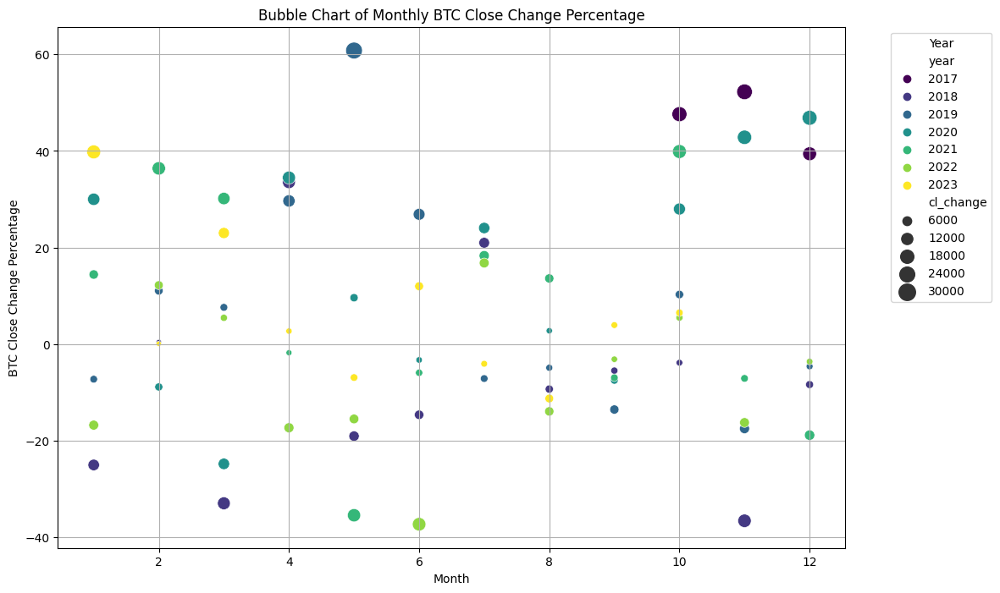

In [94]:
btc_data = df[(df['token'] == 'BTC')]

btc_monthly_avg = btc_data.groupby(['year', 'month'])['close'].last().pct_change().reset_index()
btc_monthly_avg['cl_change'] = btc_monthly_avg['close'] * 100

bubble_size = np.abs(btc_monthly_avg['cl_change']) * 500  # You can adjust the factor (300) as needed

plt.figure(figsize=(12, 8))
scatterplot = sns.scatterplot(data=btc_monthly_avg, x='month', y='cl_change', hue='year', palette='viridis', size=bubble_size, sizes=(20, 200))
plt.title("Bubble Chart of Monthly BTC Close Change Percentage")
plt.xlabel("Month")
plt.ylabel("BTC Close Change Percentage")

plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')
scatterplot.legend_.set_title("Year")

plt.grid(True)
plt.show()

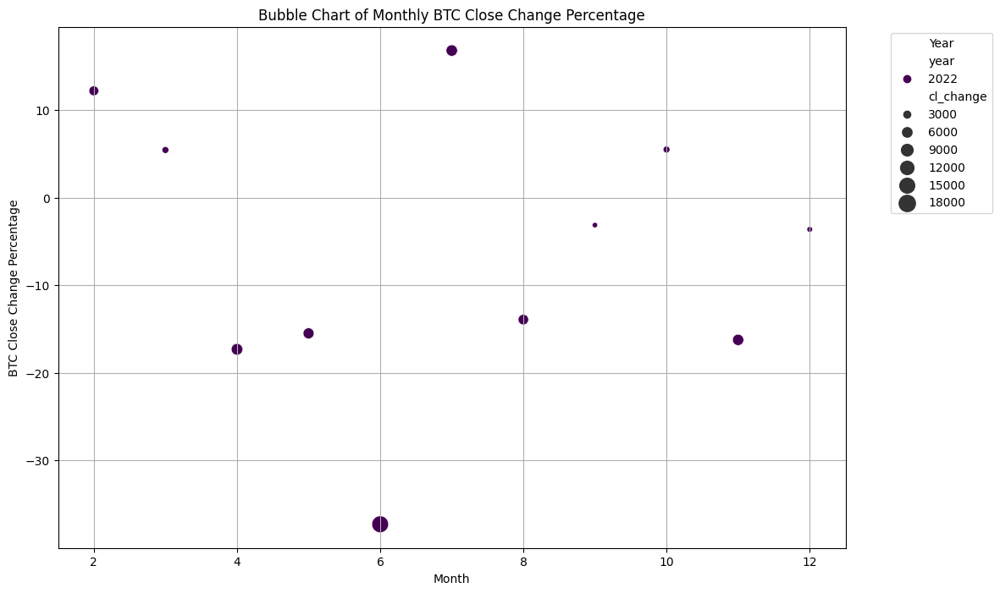

In [96]:
btc_data = df[(df['token'] == 'BTC')
             &(df.year==2022)]

btc_monthly_avg = btc_data.groupby(['year', 'month'])['close'].last().pct_change().reset_index()
btc_monthly_avg['cl_change'] = btc_monthly_avg['close'] * 100

bubble_size = np.abs(btc_monthly_avg['cl_change']) * 500  # You can adjust the factor (300) as needed

plt.figure(figsize=(12, 8))
scatterplot = sns.scatterplot(data=btc_monthly_avg, x='month', y='cl_change', hue='year', palette='viridis', size=bubble_size, sizes=(20, 200))
plt.title("Bubble Chart of Monthly BTC Close Change Percentage")
plt.xlabel("Month")
plt.ylabel("BTC Close Change Percentage")


plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')
scatterplot.legend_.set_title("Year")

plt.grid(True)
plt.show()

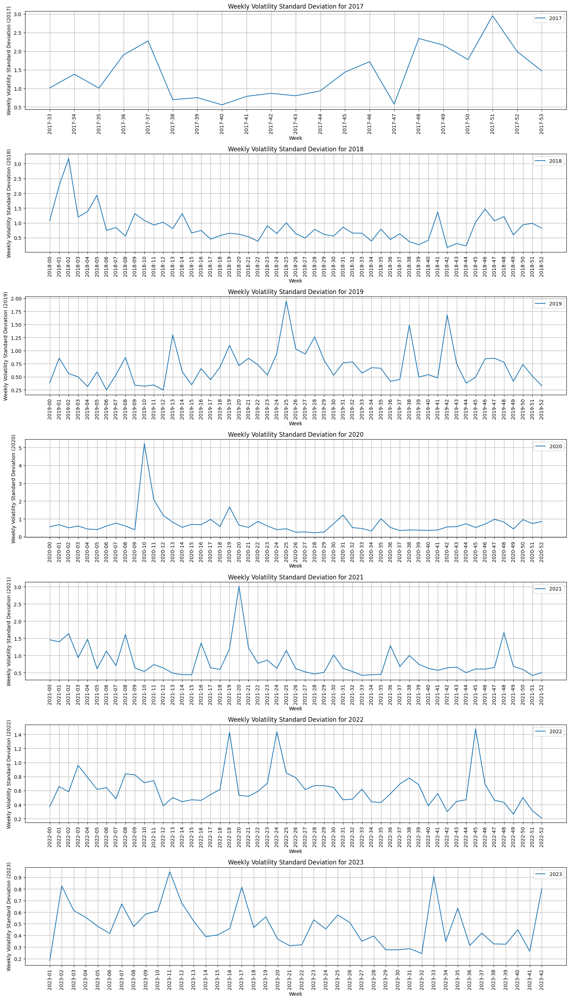

In [97]:
btc_data = df[(df['token'] == 'BTC')]

btc_data['year_week'] = btc_data['date'].dt.strftime('%Y-%U')

unique_years = btc_data['year'].unique()

fig, axes = plt.subplots(len(unique_years), 1, figsize=(16, 4 * len(unique_years)))

for i, year in enumerate(unique_years):
    data = btc_data[btc_data['year'] == year]
    
    std_deviation = data.groupby('year_week')['volatility'].std()
    
    ax = axes[i]
    
    sns.lineplot(data=std_deviation, label=str(year), ax=ax)
    
    ax.set_xlabel("Week")
    ax.set_ylabel(f"Weekly Volatility Standard Deviation ({year})")
    ax.set_title(f"Weekly Volatility Standard Deviation for {year}")
    
    ax.legend()
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    ax.grid(True)

plt.tight_layout()
plt.show()

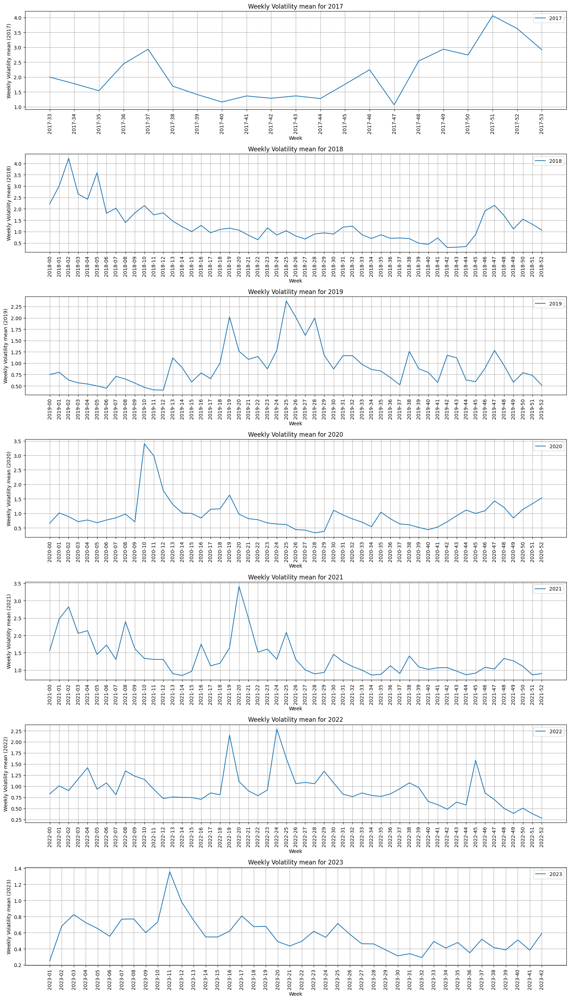

In [98]:
btc_data = df[(df['token'] == 'BTC')]

btc_data['year_week'] = btc_data['date'].dt.strftime('%Y-%U')

unique_years = btc_data['year'].unique()

fig, axes = plt.subplots(len(unique_years), 1, figsize=(16, 4 * len(unique_years)))

for i, year in enumerate(unique_years):
    data = btc_data[btc_data['year'] == year]
    
    mean = data.groupby('year_week')['volatility'].mean()
    
    ax = axes[i]
    
    sns.lineplot(data=mean, label=str(year), ax=ax)
    
    ax.set_xlabel("Week")
    ax.set_ylabel(f"Weekly Volatility mean ({year})")
    ax.set_title(f"Weekly Volatility mean for {year}")
    
    ax.legend()
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    ax.grid(True)

plt.tight_layout()
plt.show()

In [99]:
df = df_true.copy(deep=True)

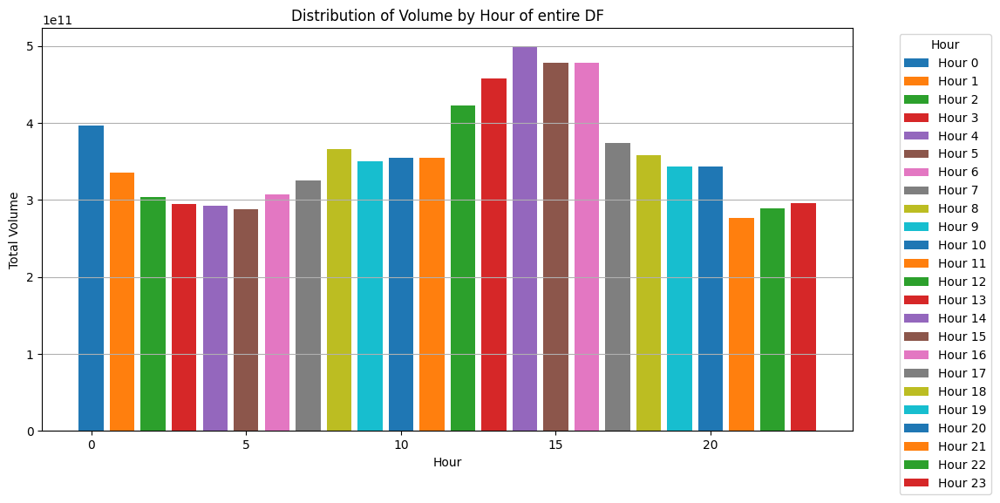

In [102]:
hourly_volume = df.groupby('hour')['volume'].sum()

plt.figure(figsize=(12, 6))
for hour, volume in hourly_volume.items():
    plt.bar(hour, volume, label=f'Hour {hour}')

plt.xlabel('Hour')
plt.ylabel('Total Volume')
plt.title('Distribution of Volume by Hour of entire DF')
plt.legend()
plt.grid(axis='y')

plt.legend(title='Hour', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

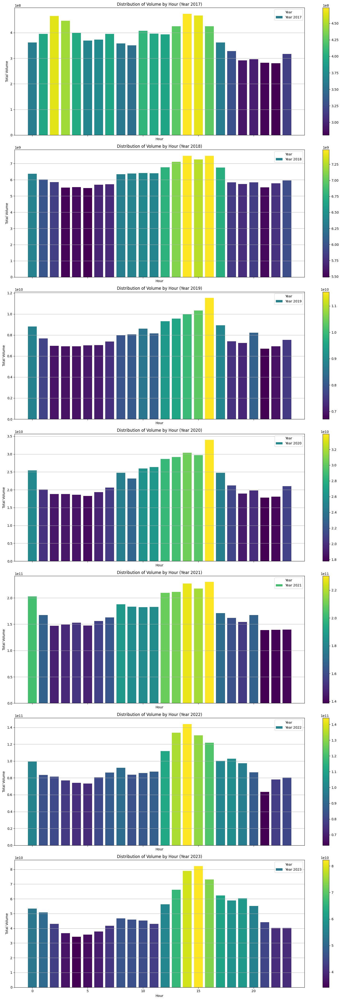

In [104]:
years = list(range(2017, 2024))

fig, axes = plt.subplots(len(years), 1, figsize=(16, 6 * len(years)), sharex=True)

for i, year in enumerate(years):
    df_year = df[df['year'] == year]
    
    hourly_volume = df_year.groupby('hour')['volume'].sum()
    
    norm = plt.Normalize(hourly_volume.min(), hourly_volume.max())
    colors = plt.cm.viridis(norm(hourly_volume.values))
    
    ax = axes[i]
    bars = ax.bar(hourly_volume.index, hourly_volume.values, color=colors)
    
    sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    
    ax.set_xlabel('Hour')
    ax.set_ylabel('Total Volume')
    ax.set_title(f'Distribution of Volume by Hour (Year {year})')
    ax.grid(axis='y')
    
    ax.legend([f'Year {year}'], title='Year')
    
plt.tight_layout()
plt.show()

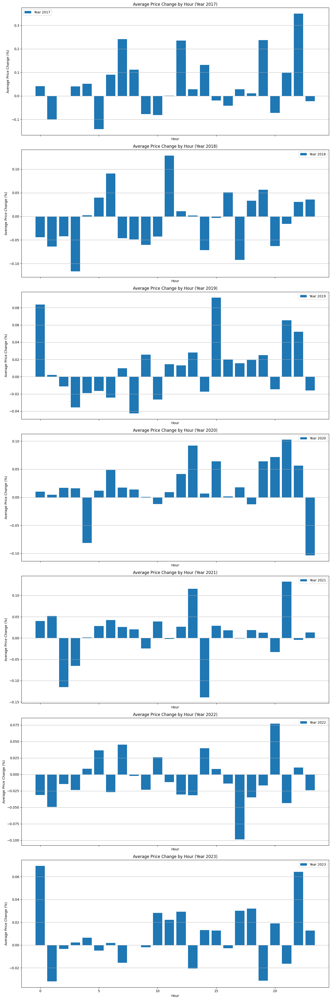

In [106]:
years = list(range(2017, 2024))

fig, axes = plt.subplots(len(years), 1, 
                         figsize=(14, 6 * len(years)), 
                         sharex=True)

for i, year in enumerate(years):
    df_year = df[(df['year'] == year) & (df['token'] == 'BTC')]
    
    hourly_price_change_sum = df_year.groupby('hour')[
                                            'price_change'].sum()
    
    hourly_price_change_mean = hourly_price_change_sum / df_year['hour'].value_counts()
    
    ax = axes[i]
    ax.bar(hourly_price_change_mean.index,
           hourly_price_change_mean.values, label=f'Year {year}')
    
    ax.set_xlabel('Hour')
    ax.set_ylabel('Average Price Change (%)')
    ax.set_title(f'Average Price Change by Hour (Year {year})')
    ax.grid(axis='y')
    
    ax.legend()
    
plt.tight_layout()
plt.show()

In [109]:
df_year

,date,symbol,open,high,low,close,volume,tradecount,token,hour,day,month,week,year,volatility,hc_change,lc_change,price_change
364411,2023-01-01 00:00:00,BTCUSDT,16541.77,16545.70,16508.39,16529.67,72146294,149854,BTC,0,Sunday,1,52,2023,0.226006,-0.096883,0.128904,-0.08
364412,2023-01-01 01:00:00,BTCUSDT,16529.59,16556.80,16525.78,16551.47,59376757,126556,BTC,1,Sunday,1,52,2023,0.187707,-0.032192,0.155454,0.13
364413,2023-01-01 02:00:00,BTCUSDT,16551.47,16559.77,16538.14,16548.19,54919453,115398,BTC,2,Sunday,1,52,2023,0.130789,-0.069929,0.060769,-0.02
364414,2023-01-01 03:00:00,BTCUSDT,16548.19,16548.19,16518.21,16533.04,70122542,137724,BTC,3,Sunday,1,52,2023,0.181497,-0.091551,0.089780,-0.09
364415,2023-01-01 04:00:00,BTCUSDT,16533.04,16535.97,16511.92,16521.85,70802644,129535,BTC,4,Sunday,1,52,2023,0.145652,-0.085390,0.060138,-0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371414,2023-10-19 19:00:00,BTCUSDT,28646.98,28765.76,28645.00,28750.75,29840591,49985,BTC,19,Thursday,10,42,2023,0.421574,-0.052180,0.369174,0.36
371415,2023-10-19 20:00:00,BTCUSDT,28750.75,28882.07,28684.80,28715.38,49976234,59830,BTC,20,Thursday,10,42,2023,0.687716,-0.577140,0.106607,-0.12
371416,2023-10-19 21:00:00,BTCUSDT,28715.39,28739.73,28604.09,28604.09,32056663,42623,BTC,21,Thursday,10,42,2023,0.474198,-0.471960,0.000000,-0.39
371417,2023-10-19 22:00:00,BTCUSDT,28604.09,28704.99,28598.60,28649.65,22004203,28479,BTC,22,Thursday,10,42,2023,0.372011,-0.192789,0.178505,0.16


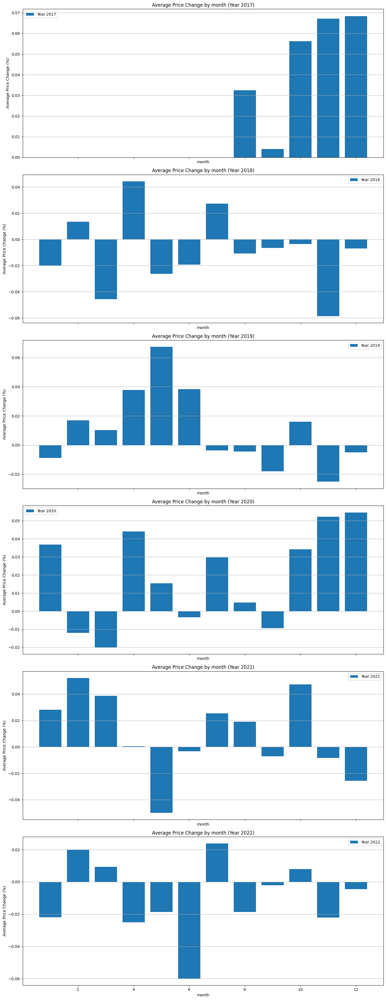

In [121]:
years = list(range(2017, 2023))

fig, axes = plt.subplots(len(years), 1, 
                         figsize=(14, 6 * len(years)), 
                         sharex=True)

for i, year in enumerate(years):
    df_year = df[(df['year'] == year) & (df['token'] == 'BTC')]
    
    hourly_price_change_sum = df_year.groupby(['month'])[
                                            'price_change'].sum()
    
    hourly_price_change_mean = hourly_price_change_sum / df_year['month'].value_counts()
    
    ax = axes[i]
    ax.bar(hourly_price_change_mean.index,
           hourly_price_change_mean.values, label=f'Year {year}')
    
    ax.set_xlabel('month')
    ax.set_ylabel('Average Price Change (%)')
    ax.set_title(f'Average Price Change by month (Year {year})')
    ax.grid(axis='y')
    
    ax.legend()
    
plt.tight_layout()
plt.show()

In [125]:
def power_heatmap(pivot_table, pivot_hc_change, pivot_lc_change, title='Heatmap'):
    """
    Draw a heatmap based on the provided pivot tables, with additional rows and columns for averages.

    Args:
    - pivot_table (pd.DataFrame): The main pivot table with the primary values for the heatmap.
    - pivot_hc_change (pd.DataFrame): Pivot table with hc_change values.
    - pivot_lc_change (pd.DataFrame): Pivot table with lc_change values.
    - title (str): Title for the heatmap. Default is 'Heatmap'.
    """
    # Pivot Arrangement
    hourly_avg = pivot_table.mean(axis=0)
    hourly_avg_df = pd.DataFrame(hourly_avg).transpose()
    hourly_avg_df.index = ['H. Avg']
    hourly_avg_df.index.name = 'week'
    
    pivot_table = pd.concat([pivot_table, hourly_avg_df])

    weekly_avg = pivot_table.mean(axis=1)
    weekly_avg_df = weekly_avg.to_frame(name='W. Avg')
    
    pivot_table = pd.concat([pivot_table, weekly_avg_df], axis=1)

    hourly_avg_hc = pivot_hc_change.mean(axis=0)
    hourly_avg_df_hc = pd.DataFrame(hourly_avg_hc).transpose()
    hourly_avg_df_hc.index = ['H. Avg']
    hourly_avg_df_hc.index.name = 'week'
    pivot_hc_change = pd.concat([pivot_hc_change, hourly_avg_df_hc])
    
    weekly_avg_hc = pivot_hc_change.mean(axis=1)
    weekly_avg_df_hc = weekly_avg_hc.to_frame(name='W. Avg')
    pivot_hc_change = pd.concat([pivot_hc_change, weekly_avg_df_hc], axis=1)
    
    hourly_avg_lc = pivot_lc_change.mean(axis=0)
    hourly_avg_df_lc = pd.DataFrame(hourly_avg_lc).transpose()
    hourly_avg_df_lc.index = ['H. Avg']
    hourly_avg_df_lc.index.name = 'week'
    pivot_lc_change = pd.concat([pivot_lc_change, hourly_avg_df_lc])
    
    weekly_avg_lc = pivot_lc_change.mean(axis=1)
    weekly_avg_df_lc = weekly_avg_lc.to_frame(name='W. Avg')
    pivot_lc_change = pd.concat([pivot_lc_change, weekly_avg_df_lc], axis=1)

    # Heatmap
    colors = ["blue", "white", "red"]
    vmin = pivot_table.min().min()
    vmax = pivot_table.max().max()
    divnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
    cmap = LinearSegmentedColormap.from_list(name='custom', colors=colors)

    fig, ax = plt.subplots(figsize=(20, 24))
    sns.heatmap(pivot_table, ax=ax, cmap=cmap, annot=True, fmt='.2f', cbar=False, norm=divnorm)

    for i in range(len(pivot_table.index)):
        for j in range(len(pivot_table.columns)):
            original_annot = ax.texts[i*len(pivot_table.columns) + j].get_text()
            hc_value = pivot_hc_change.iloc[i, j]
            lc_value = pivot_lc_change.iloc[i, j]
            new_annot = f"{original_annot}\nHC: {hc_value:.2f}\nLC: {lc_value:.2f}"
            ax.texts[i*len(pivot_table.columns) + j].set_text(new_annot)

    ax.set_xlabel('Hour', labelpad=20, rotation=0) 
    ax.set_ylabel('Week', labelpad=20, rotation=0)   
    ax.set_title(title)

    yticks = ax.get_yticks()
    yticklabels = ax.get_yticklabels()
    for y in yticks[:-1]:
        ax.hlines(y + 0.5, xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], colors='black', linewidth=6)
    ax.set_yticklabels(yticklabels)

    xticks = ax.get_xticks()
    xticklabels = ax.get_xticklabels()
    for x in xticks[:-1]:
        ax.vlines(x + 0.5, ymin=ax.get_ylim()[1], ymax=ax.get_ylim()[0], colors='black', linewidth=2)
    ax.set_xticklabels(xticklabels)

    ax.set_aspect(2)

    plt.tight_layout()
    plt.show()

# power_heatmap(pivot_table, pivot_hc_change, pivot_lc_change, title='Title')

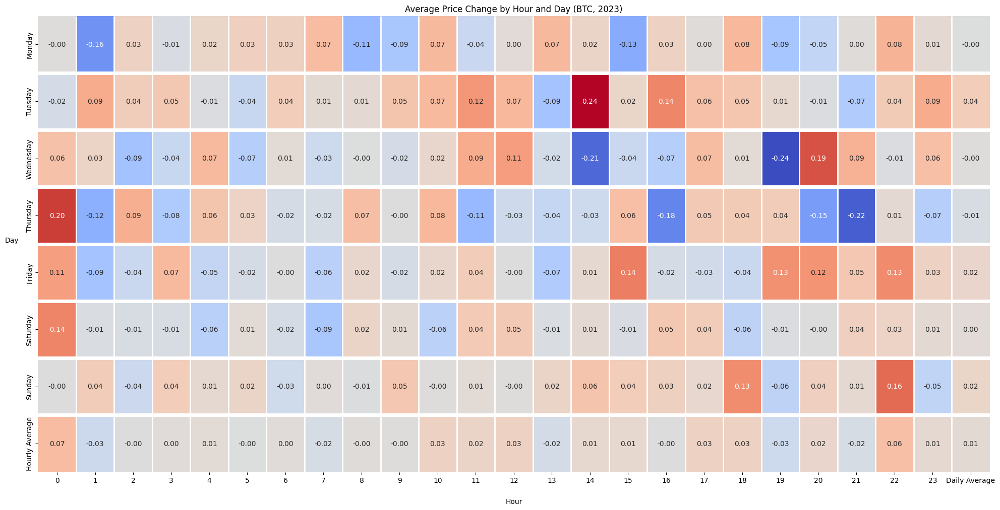

In [127]:
df_fil = df[(df['year'] == 2023) & (df['token'] == 'BTC')]

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_fil['day'] = pd.Categorical(df_fil['day'], categories=day_order, ordered=True)

daily_hourly_price_change_mean = df_fil.groupby(['day', 'hour'])['price_change'].mean()
daily_hourly_price_change_mean = daily_hourly_price_change_mean.reset_index()

pivot_table = daily_hourly_price_change_mean.pivot(index='day', columns='hour', values='price_change')
pivot_table = pivot_table.loc[day_order]

hourly_avg = pivot_table.mean(axis=0)
hourly_avg_df = pd.DataFrame(hourly_avg).transpose()
hourly_avg_df.index = ['Hourly Average']
hourly_avg_df.index.name = 'day'

pivot_table = pd.concat([pivot_table, hourly_avg_df])

daily_avg = pivot_table.mean(axis=1)
daily_avg_df = daily_avg.to_frame(name='Daily Average')

pivot_table = pd.concat([pivot_table, daily_avg_df], axis=1)

fig, ax = plt.subplots(figsize=(20, 24))

sns.heatmap(pivot_table, ax=ax, cmap='coolwarm', annot=True, fmt='.2f', cbar=False)

ax.set_xlabel('Hour', labelpad=20, rotation=0) 
ax.set_ylabel('Day', labelpad=20, rotation=0)   
ax.set_title('Average Price Change by Hour and Day (BTC, 2023)')

yticks = ax.get_yticks()
yticklabels = ax.get_yticklabels()

for y in yticks[:-1]:
    ax.hlines(y + 0.5, xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], colors='white', linewidth=5)

ax.set_yticklabels(yticklabels)

xticks = ax.get_xticks()
xticklabels = ax.get_xticklabels()

for x in xticks[:-1]:
    ax.vlines(x + 0.5, ymin=ax.get_ylim()[1], ymax=ax.get_ylim()[0], colors='white', linewidth=2)


ax.set_xticklabels(xticklabels)
ax.set_aspect(1.5)

plt.tight_layout()
plt.show()

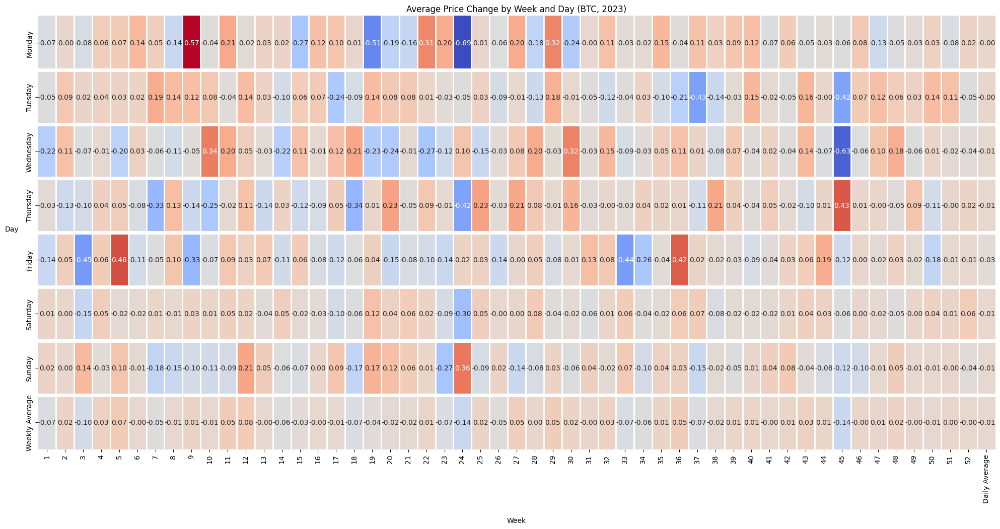

In [141]:
df_fil = df[(df['year'] == 2022) & (df['token'] == 'BTC')]

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_fil['day'] = pd.Categorical(df_fil['day'], categories=day_order, ordered=True)

daily_hourly_price_change_mean = df_fil.groupby(['day', 'week'])['price_change'].mean()
daily_hourly_price_change_mean = daily_hourly_price_change_mean.reset_index()

pivot_table = daily_hourly_price_change_mean.pivot(index='day', columns='week', values='price_change')
pivot_table = pivot_table.loc[day_order]

hourly_avg = pivot_table.mean(axis=0)
hourly_avg_df = pd.DataFrame(hourly_avg).transpose()
hourly_avg_df.index = ['Weekly Average']
hourly_avg_df.index.name = 'day'

pivot_table = pd.concat([pivot_table, hourly_avg_df])

daily_avg = pivot_table.mean(axis=1)
daily_avg_df = daily_avg.to_frame(name='Daily Average')

pivot_table = pd.concat([pivot_table, daily_avg_df], axis=1)

fig, ax = plt.subplots(figsize=(20, 24))

sns.heatmap(pivot_table, ax=ax, cmap='coolwarm', annot=True, fmt='.2f', cbar=False)

ax.set_xlabel('Week', labelpad=20, rotation=0) 
ax.set_ylabel('Day', labelpad=20, rotation=0)   
ax.set_title('Average Price Change by Week and Day (BTC, 2023)')

yticks = ax.get_yticks()
yticklabels = ax.get_yticklabels()

for y in yticks[:-1]:
    ax.hlines(y + 0.5, xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], colors='white', linewidth=5)

ax.set_yticklabels(yticklabels)

xticks = ax.get_xticks()
xticklabels = ax.get_xticklabels()

for x in xticks[:-1]:
    ax.vlines(x + 0.5, ymin=ax.get_ylim()[1], ymax=ax.get_ylim()[0], colors='white', linewidth=2)


ax.set_xticklabels(xticklabels)
ax.set_aspect(3)

plt.tight_layout()
plt.show()

# better visualization for daily changes would be nice here, sth. like bargraphs. see above

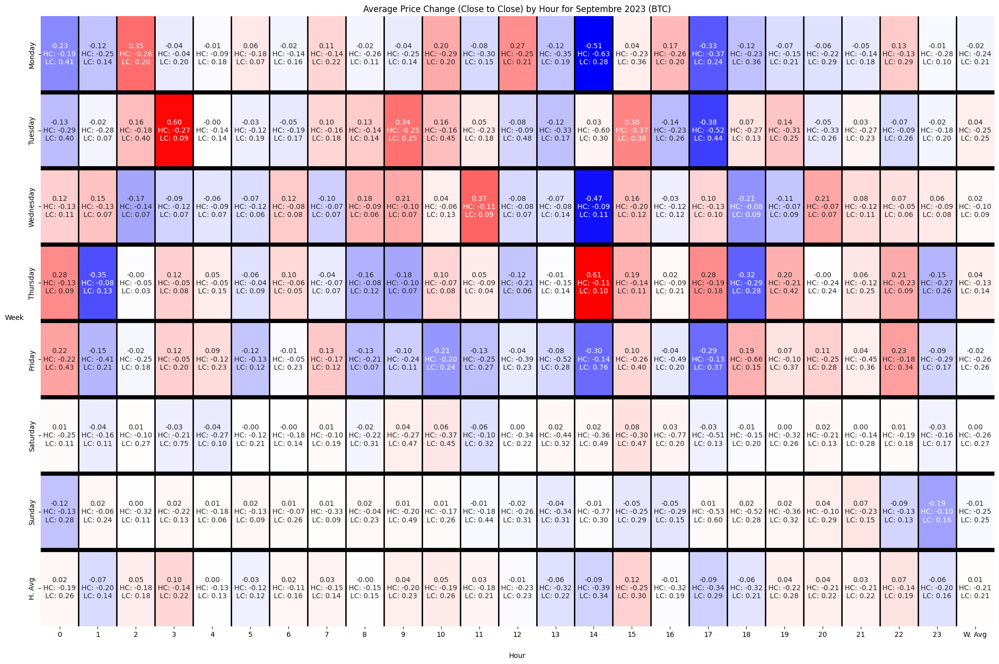

In [143]:
df_fil = df[(df['year'] == 2023) & (df['month'].isin([9])) & (df['token'] == 'BTC')]

daily_hourly_means = df_fil.groupby(['day', 'hour'])[['price_change', 'hc_change', 'lc_change']].mean().reset_index()

pivot_table = daily_hourly_means.pivot(index='day', columns='hour', values='price_change').sort_index()
pivot_table = pivot_table.loc[day_order]
pivot_hc_change = daily_hourly_means.pivot(index='day', columns='hour', values='hc_change').sort_index()
pivot_lc_change = daily_hourly_means.pivot(index='day', columns='hour', values='lc_change').sort_index()

power_heatmap(pivot_table, pivot_hc_change, pivot_lc_change, title='Average Price Change (Close to Close) by Hour for Septembre 2023 (BTC)')

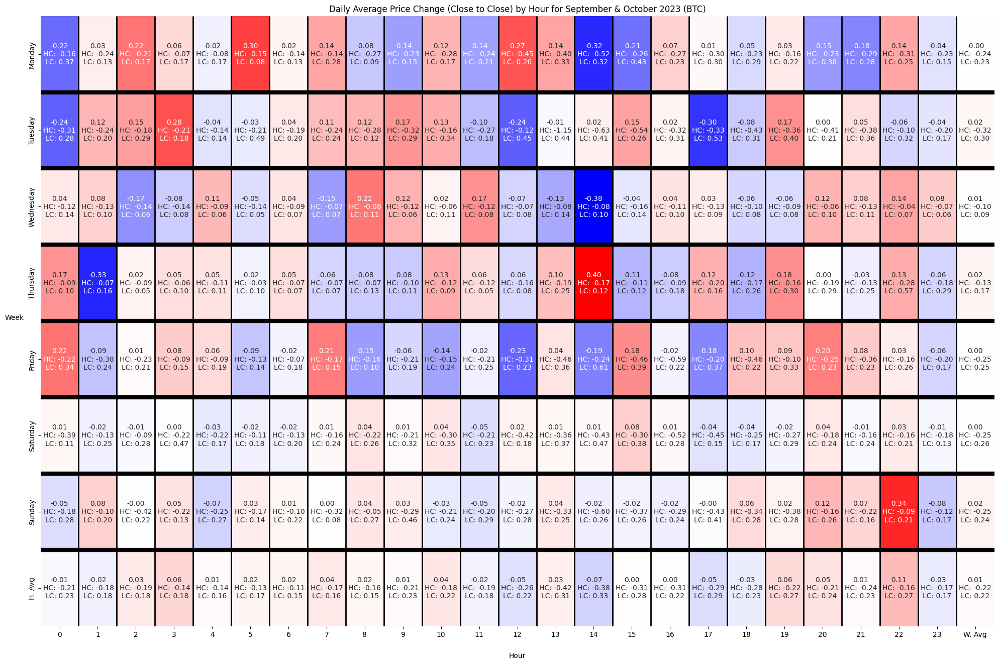

In [144]:
df_fil = df[(df['year'] == 2023) & (df['month'].isin([9, 10])) & (df['token'] == 'BTC')]

d_hourly_means = df_fil.groupby(['day', 'hour'])[['price_change', 'hc_change', 'lc_change']].mean().reset_index()

pivot_table = d_hourly_means.pivot(index='day', columns='hour', values='price_change').sort_index()
pivot_table = pivot_table.loc[day_order]
pivot_hc_change = d_hourly_means.pivot(index='day', columns='hour', values='hc_change').sort_index()
pivot_lc_change = d_hourly_means.pivot(index='day', columns='hour', values='lc_change').sort_index()

power_heatmap(pivot_table, pivot_hc_change, pivot_lc_change, title='Daily Average Price Change (Close to Close) by Hour for September & October 2023 (BTC)')

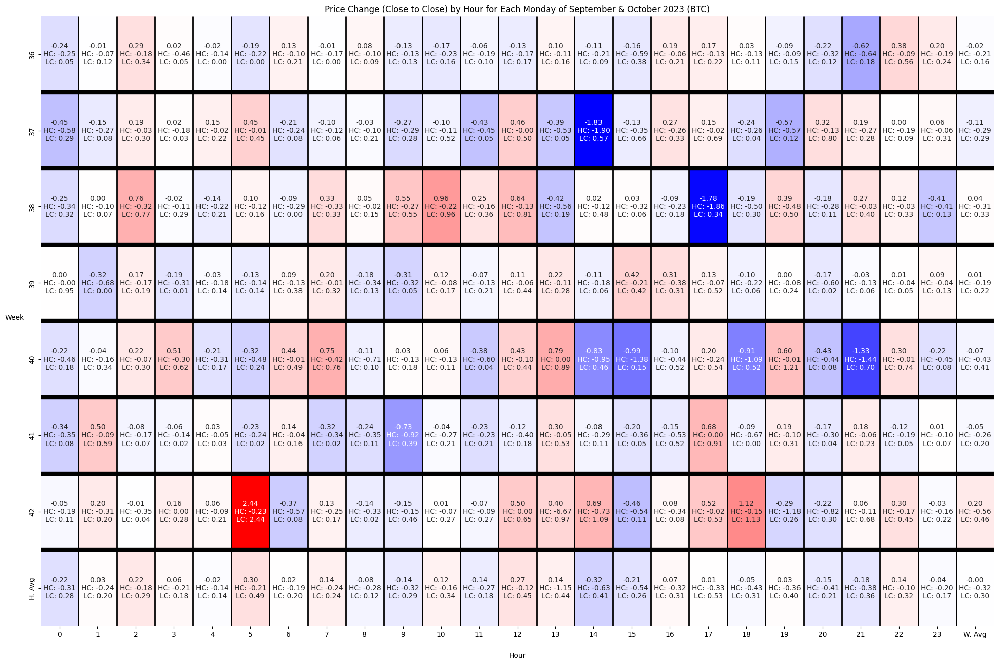

In [148]:
df_fil = df[(df['year'] == 2023) & 
            (df['month'].isin([9, 10])) & 
            (df['token'] == 'BTC') &
            (df['day'] == 'Monday')
            ]

weekly_hourly_means = df_fil.groupby(['week', 'day', 'hour'])[
                    ['price_change', 'hc_change', 'lc_change']].mean().reset_index()

pivot_table = weekly_hourly_means.pivot(index='week', columns='hour', values='price_change').sort_index()
pivot_hc_change = weekly_hourly_means.pivot(index='week', columns='hour', values='hc_change').sort_index()
pivot_lc_change = weekly_hourly_means.pivot(index='week', columns='hour', values='lc_change').sort_index()

power_heatmap(pivot_table, 
              pivot_hc_change,
              pivot_lc_change, 
              title='Price Change (Close to Close) by Hour for Each Monday of September & October 2023 (BTC)')

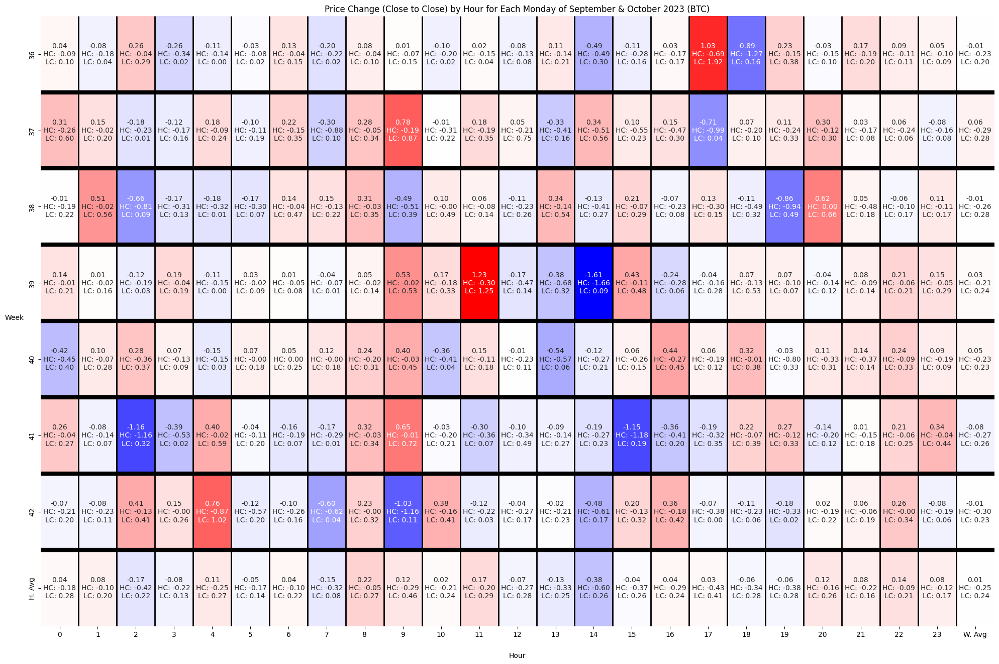

In [149]:
df_fil = df[(df['year'] == 2023) & 
            (df['month'].isin([9, 10])) & 
            (df['token'] == 'BTC') &
            (df['day'] == 'Wednesday')
            ]

weekly_hourly_means = df_fil.groupby(['week', 'day', 'hour'])[
                    ['price_change', 'hc_change', 'lc_change']].mean().reset_index()

pivot_table = weekly_hourly_means.pivot(index='week', columns='hour', values='price_change').sort_index()
pivot_hc_change = weekly_hourly_means.pivot(index='week', columns='hour', values='hc_change').sort_index()
pivot_lc_change = weekly_hourly_means.pivot(index='week', columns='hour', values='lc_change').sort_index()

power_heatmap(pivot_table, 
              pivot_hc_change,
              pivot_lc_change, 
              title='Price Change (Close to Close) by Hour for Each Monday of September & October 2023 (BTC)')

In [150]:
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

In [151]:
df_sea = df[(df['year'] == 2023) & (df['token'] == 'BTC')]
stlbtc = df_sea['price_change']

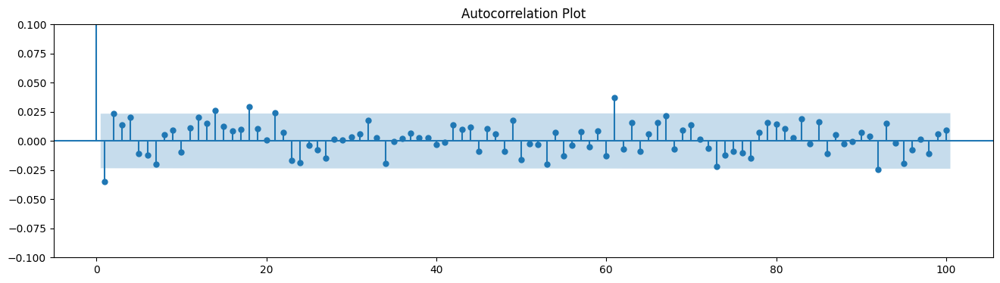

In [152]:
fig, ax = plt.subplots(figsize=(16, 4))
plot_acf(stlbtc, lags=100, ax=ax)
ax.set_ylim(-0.1, 0.1)
plt.title('Autocorrelation Plot')
plt.show()

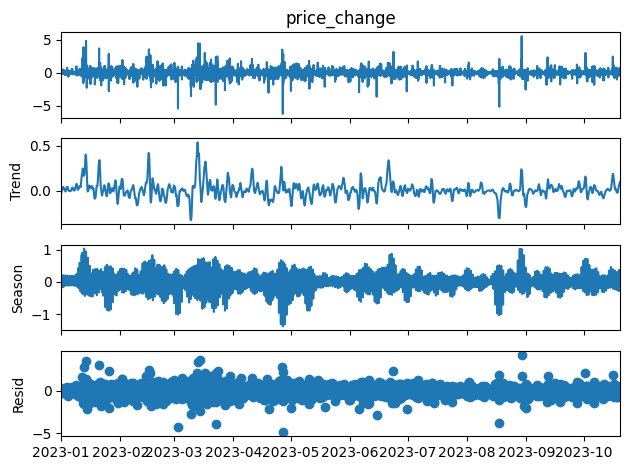

In [169]:
stl = STL(stlbtc,seasonal=9)
res = stl.fit()

fig = res.plot()
plt.show()

In [181]:
df_sea23 = df[(df['year'] == 2023) &
              (df['token'] == 'BTC') &
              #(df['month'].isin([9])) &
              (df['week'].isin([34,35,36]))]
stl23 = df_sea23['price_change']

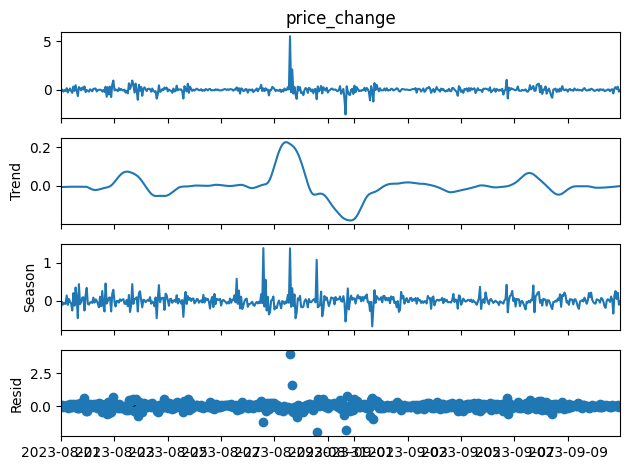

In [182]:
stl = STL(stl23)
res = stl.fit()
fig = res.plot()
plt.show()

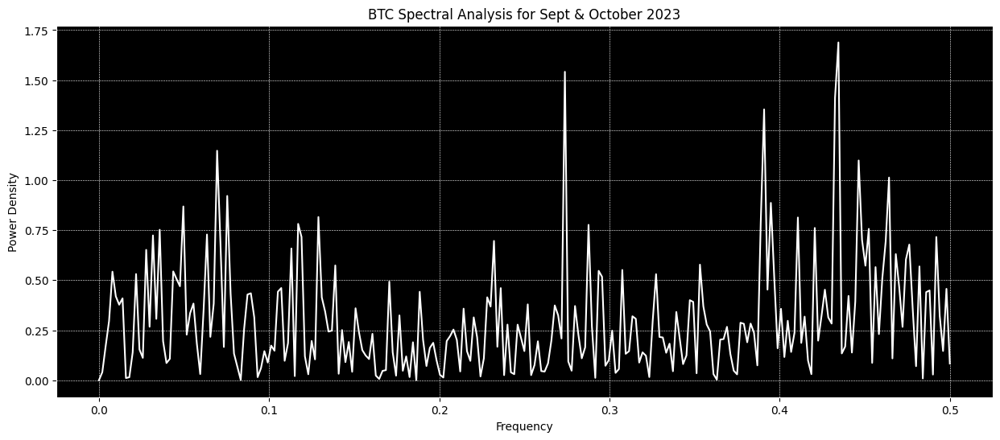

In [183]:
frequencies, power_density = periodogram(stl23, scaling='density')
plt.figure(figsize=(15, 6))
plt.gca().set_facecolor('black')
plt.plot(frequencies, power_density, color='white')

plt.xlabel('Frequency', color='black')
plt.ylabel('Power Density', color='black')
plt.title('BTC Spectral Analysis for Sept & October 2023', color='black')
plt.tick_params(axis='both', labelcolor='black', colors='black')
plt.grid(True, which='both', linestyle='--', linewidth=0.4, color='white')

for spine in plt.gca().spines.values():
    spine.set_edgecolor('white')

plt.show()

In [184]:
df_sea23 = df[(df['year'] == 2023) 
              & (df['month'].isin([9, 10])) 
              & (df['token'] == 'BTC') 
              & (df['day'] == 'Monday')]
stlspec = df_sea23['price_change']

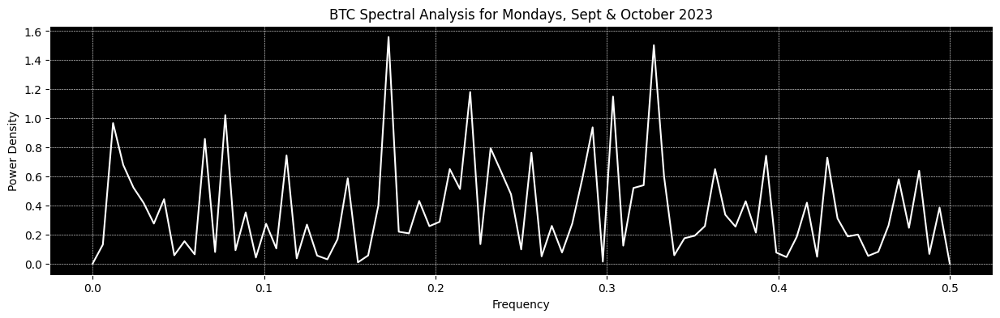

In [185]:
frequencies, power_density = periodogram(stlspec, scaling='density')
plt.figure(figsize=(15, 4))
plt.gca().set_facecolor('black')
plt.plot(frequencies, power_density, color='white')

plt.xlabel('Frequency', color='black')
plt.ylabel('Power Density', color='black')
plt.title('BTC Spectral Analysis for Mondays, Sept & October 2023', color='black')
plt.tick_params(axis='both', labelcolor='black', colors='black')
plt.grid(True, which='both', linestyle='--', linewidth=0.4, color='white')

for spine in plt.gca().spines.values():
    spine.set_edgecolor('white')

plt.show()

In [187]:
stl23

date
2023-08-21 00:00:00   -0.18
2023-08-21 01:00:00    0.02
2023-08-21 02:00:00   -0.19
2023-08-21 03:00:00   -0.03
2023-08-21 04:00:00   -0.12
                       ... 
2023-09-10 19:00:00    0.28
2023-09-10 20:00:00    0.08
2023-09-10 21:00:00    0.32
2023-09-10 22:00:00   -0.19
2023-09-10 23:00:00   -0.04
Name: price_change, Length: 504, dtype: float64

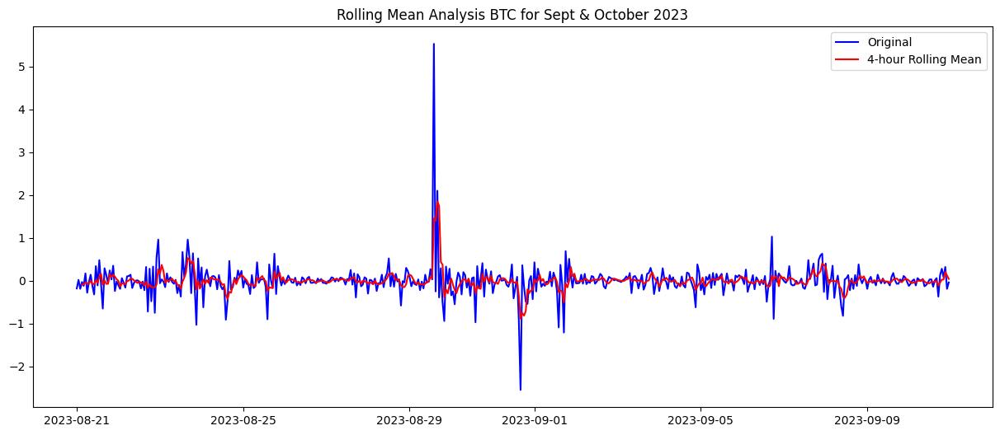

In [192]:
rolling_mean = stl23.rolling(window=4).mean()

plt.figure(figsize=(15, 6))
plt.plot(stl23, label="Original", color='blue')
plt.plot(rolling_mean, label="4-hour Rolling Mean", color='red')
plt.legend()
plt.title('Rolling Mean Analysis BTC for Sept & October 2023')
plt.show()


In [193]:
df_z = df.copy(deep=True)

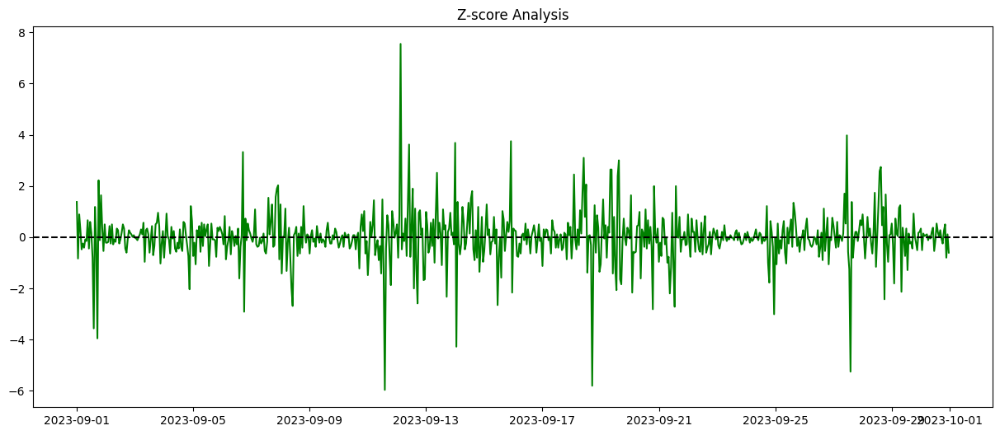

In [195]:
df_z = df_z[(df_z['year'] == 2023) & (df_z['token'] == 'BTC') & (df_z['month'].isin([9]))]
df_zscore = df_z['price_change']

mean = df_zscore.mean()
std_dev = df_zscore.std()
z_scores = (df_zscore - mean) / std_dev

plt.figure(figsize=(15, 6))
plt.plot(z_scores, label="Z-scores", color='green')
plt.axhline(0, color='black', linestyle='--')  # Mean line
plt.title('Z-score Analysis')
plt.show()

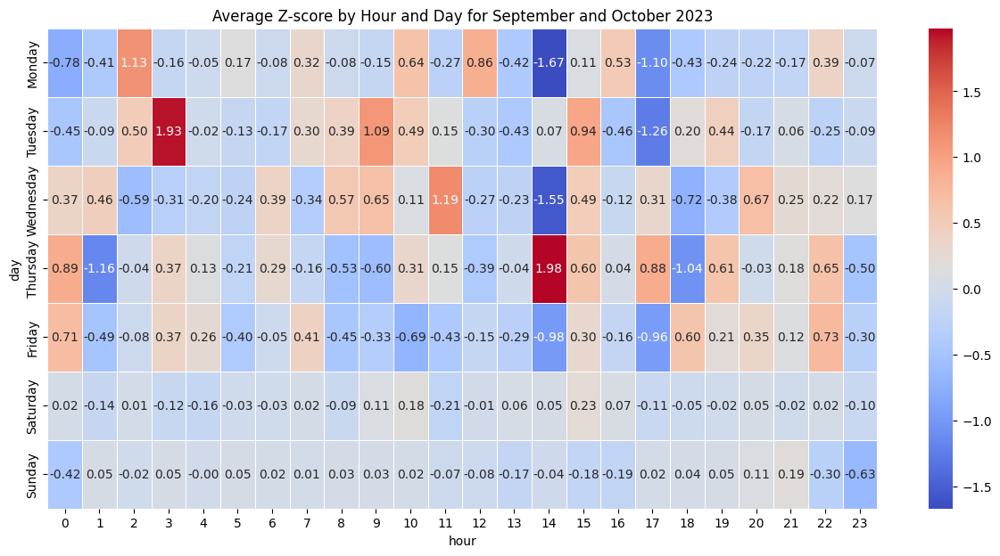

In [196]:
df_z['day'] = df_z.index.day_name()
df_z['hour'] = df_z.index.hour
df_z['zscore'] = (df_z['price_change'] - df_z['price_change'].mean()) / df_z['price_change'].std()

zscore_by_day_hour = df_z.groupby(['day', 'hour'])['zscore'].mean().unstack()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
zscore_by_day_hour = zscore_by_day_hour.reindex(day_order)

plt.figure(figsize=(15, 7))
sns.heatmap(zscore_by_day_hour, cmap="coolwarm", annot=True, fmt=".2f", linewidths=.5)
plt.title('Average Z-score by Hour and Day for September and October 2023')
plt.show()

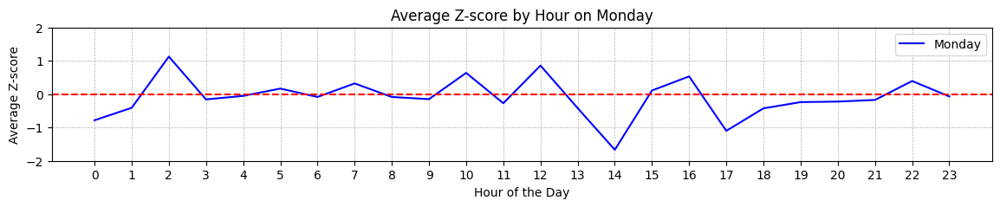

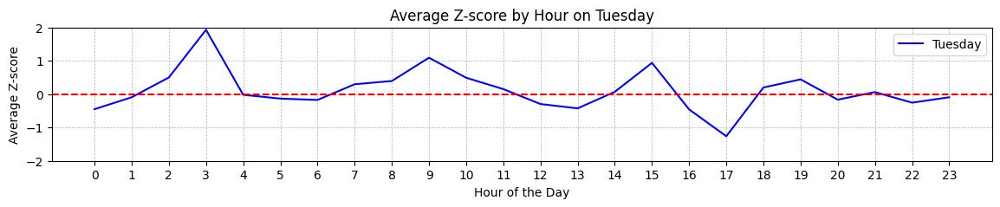

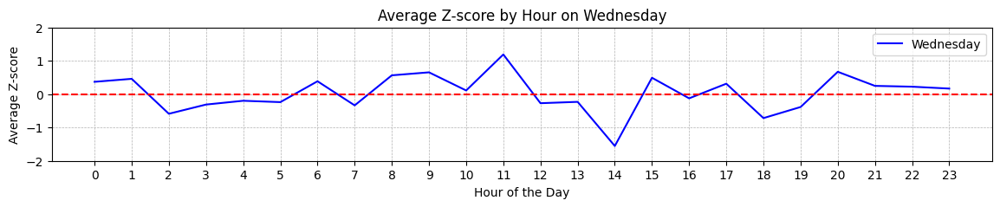

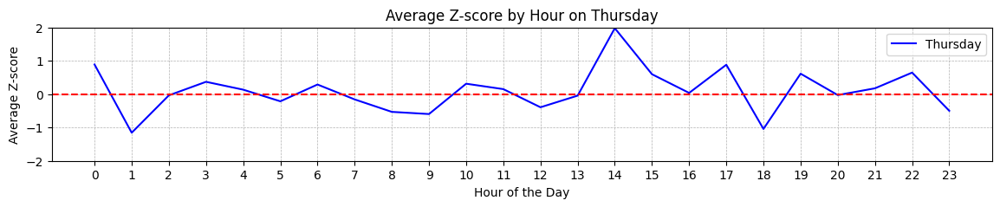

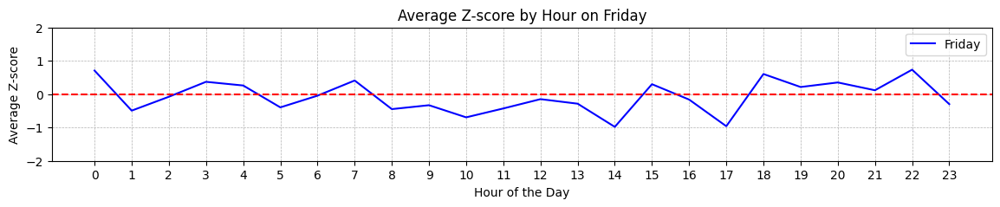

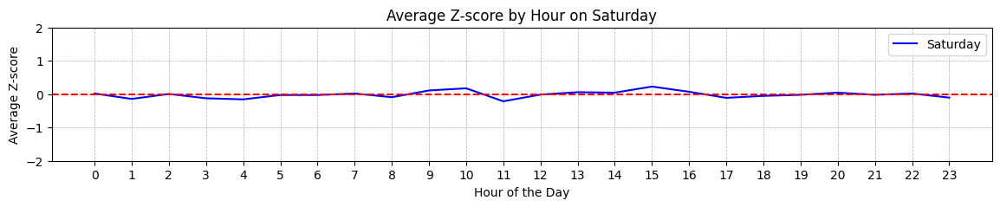

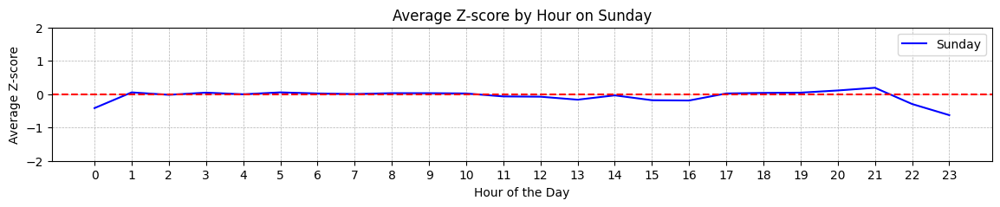

In [199]:
df_z2 = df.copy(deep=True)

df_z2 = df_z[(df_z['year'] == 2023) & (df_z['token'] == 'BTC') & (df_z['month'].isin([9, 10]))]

df_z2['zscore'] = (df_z2['price_change'] - df_z2['price_change'].mean()) / df_z2['price_change'].std()

avg_zscore_by_day_hour = df_z2.groupby(['day', 'hour'])['zscore'].mean().unstack()

for day in day_order:
    plt.figure(figsize=(14, 2))
    plt.plot(avg_zscore_by_day_hour.columns, avg_zscore_by_day_hour.loc[day], label=day, color='blue')
    plt.axhline(0, color='red', linestyle='--') 
    plt.title(f'Average Z-score by Hour on {day}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Average Z-score')
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.ylim(-2,2)
    
    plt.xticks(avg_zscore_by_day_hour.columns)
    
    plt.show()

In [221]:
# this function goes through everyday and tests every possible timewindow and caluclates
# the cummulative sum of price changes per time interval 

def compute_top_3_deltas(df_day):
    deltas = []

    for i, (index_i, row_i) in enumerate(df_day.iterrows()):
        cumulative_change = 0
        for j, (index_j, row_j) in enumerate(df_day.iloc[i:].iterrows()):
            cumulative_change += row_j['price_change']
            deltas.append((cumulative_change, index_i.hour, index_j.hour))
    
    sorted_deltas = sorted(deltas, key=lambda x: abs(x[0]), reverse=True)[:3]
    

    data = []
    for delta in sorted_deltas:
        data.extend([delta[1], delta[2], delta[0]])

    return pd.Series(data, index=['Start_Hour_1', 'End_Hour_1', 'Max_Delta_1',
                                  'Start_Hour_2', 'End_Hour_2', 'Max_Delta_2',
                                  'Start_Hour_3', 'End_Hour_3', 'Max_Delta_3'])

top_3_deltas = df_z2.groupby(df_z2.index.date).apply(compute_top_3_deltas)

top_3_deltas.head()

,Start_Hour_1,End_Hour_1,Max_Delta_1,Start_Hour_2,End_Hour_2,Max_Delta_2,Start_Hour_3,End_Hour_3,Max_Delta_3
2023-09-01,4.0,17.0,-2.31,13.0,17.0,-2.25,3.0,17.0,-2.22
2023-09-02,3.0,15.0,0.52,2.0,15.0,0.47,5.0,15.0,0.45
2023-09-03,17.0,20.0,0.78,3.0,20.0,0.73,4.0,20.0,0.72
2023-09-04,4.0,21.0,-1.21,9.0,21.0,-1.20,3.0,21.0,-1.19
2023-09-05,0.0,2.0,-0.60,3.0,12.0,0.60,0.0,19.0,-0.55


<Axes: xlabel='Start_Hour_1', ylabel='Count'>

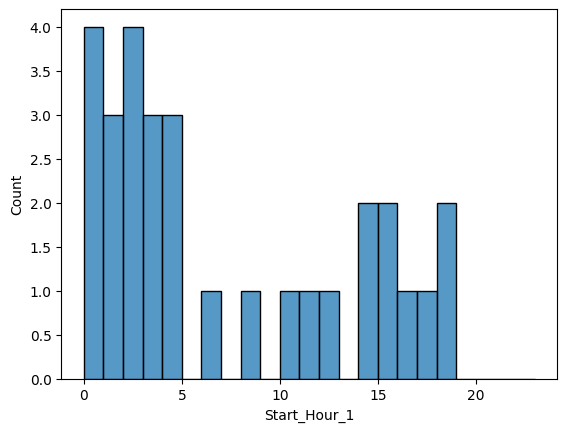

In [230]:
sns.histplot(data=top_3_deltas,x='Start_Hour_1',bins=np.arange(24))

In [231]:
long_format = top_3_deltas.melt(value_vars=['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3'], 
                                var_name='Type', value_name='Hour')

start_hour_counts = long_format['Hour'].value_counts().sort_index()

long_format = top_3_deltas.melt(value_vars=['End_Hour_1', 'End_Hour_2', 'End_Hour_3'], 
                                var_name='Type', value_name='Hour')
end_hour_counts = long_format['Hour'].value_counts().sort_index()

print("Start Hour Counts:\n", start_hour_counts)
print("\nEnd Hour Counts:\n", end_hour_counts)

Start Hour Counts:
 Hour
0.0     15
1.0      5
2.0     10
3.0     13
4.0      8
5.0      4
6.0      3
7.0      1
8.0      4
9.0      1
10.0     3
11.0     1
12.0     4
13.0     4
14.0     3
15.0     3
16.0     2
17.0     2
18.0     3
19.0     1
Name: count, dtype: int64

End Hour Counts:
 Hour
2.0      1
5.0      1
6.0      1
7.0      1
9.0      2
11.0     2
12.0     4
13.0     7
14.0     3
15.0    12
16.0     5
17.0    12
18.0     3
19.0     8
20.0    10
21.0     6
22.0     8
23.0     4
Name: count, dtype: int64


In [232]:
top_deltas = top_3_deltas.copy(deep=True)

In [233]:
top_deltas['day'] = pd.to_datetime(top_deltas.index).day_name()
top_deltas['day'] = pd.Categorical(top_deltas['day'], categories=day_order, ordered=True)

In [234]:
positive_deltas = top_deltas[top_deltas[['Max_Delta_1', 'Max_Delta_2', 'Max_Delta_3']].max(axis=1) > 0]
negative_deltas = top_deltas[top_deltas[['Max_Delta_1', 'Max_Delta_2', 'Max_Delta_3']].min(axis=1) < 0]

positive_start_hours = positive_deltas[['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3']].stack().value_counts()
positive_end_hours = positive_deltas[['End_Hour_1', 'End_Hour_2', 'End_Hour_3']].stack().value_counts()

negative_start_hours = negative_deltas[['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3']].stack().value_counts()
negative_end_hours = negative_deltas[['End_Hour_1', 'End_Hour_2', 'End_Hour_3']].stack().value_counts()

positive_start_hours, positive_end_hours, negative_start_hours, negative_end_hours

(0.0     13
 3.0      7
 2.0      7
 4.0      5
 14.0     3
 12.0     3
 1.0      3
 17.0     2
 16.0     2
 18.0     2
 10.0     2
 5.0      1
 13.0     1
 19.0     1
 6.0      1
 15.0     1
 Name: count, dtype: int64,
 15.0    9
 17.0    8
 22.0    8
 20.0    6
 12.0    4
 13.0    4
 14.0    3
 19.0    2
 21.0    2
 16.0    2
 18.0    2
 11.0    2
 2.0     1
 23.0    1
 Name: count, dtype: int64,
 3.0     9
 0.0     7
 8.0     4
 4.0     3
 13.0    3
 2.0     3
 5.0     3
 15.0    2
 6.0     2
 18.0    2
 14.0    2
 1.0     2
 12.0    2
 19.0    1
 7.0     1
 11.0    1
 10.0    1
 17.0    1
 16.0    1
 9.0     1
 Name: count, dtype: int64,
 17.0    7
 19.0    7
 21.0    6
 20.0    4
 23.0    4
 13.0    4
 15.0    4
 16.0    3
 9.0     2
 11.0    2
 18.0    1
 22.0    1
 12.0    1
 6.0     1
 7.0     1
 2.0     1
 5.0     1
 14.0    1
 Name: count, dtype: int64)

In [235]:
start_hours_positive = positive_start_hours.reindex(np.arange(24), fill_value=0)
start_hours_negative = negative_start_hours.reindex(np.arange(24), fill_value=0)

In [236]:
start_hours_negative

0     7
1     2
2     3
3     9
4     3
5     3
6     2
7     1
8     4
9     1
10    1
11    1
12    2
13    3
14    2
15    2
16    1
17    1
18    2
19    1
20    0
21    0
22    0
23    0
Name: count, dtype: int64

In [237]:
positive_durations = positive_deltas[['Start_Hour_1', 'End_Hour_1', 'Start_Hour_2', 'End_Hour_2', 'Start_Hour_3', 'End_Hour_3']]
positive_avg_durations = ((positive_durations['End_Hour_1'] - positive_durations['Start_Hour_1']) +
                          (positive_durations['End_Hour_2'] - positive_durations['Start_Hour_2']) +
                          (positive_durations['End_Hour_3'] - positive_durations['Start_Hour_3'])) / 3

negative_durations = negative_deltas[['Start_Hour_1', 'End_Hour_1', 'Start_Hour_2', 'End_Hour_2', 'Start_Hour_3', 'End_Hour_3']]
negative_avg_durations = ((negative_durations['End_Hour_1'] - negative_durations['Start_Hour_1']) +
                          (negative_durations['End_Hour_2'] - negative_durations['Start_Hour_2']) +
                          (negative_durations['End_Hour_3'] - negative_durations['Start_Hour_3'])) / 3

In [238]:
positive_avg_durations

2023-09-02    11.666667
2023-09-03    12.000000
2023-09-05    10.000000
2023-09-06     4.333333
2023-09-07     9.000000
2023-09-09    10.000000
2023-09-10     7.333333
2023-09-12    12.000000
2023-09-13    17.666667
2023-09-14    11.000000
2023-09-15     5.666667
2023-09-18    11.000000
2023-09-19    14.000000
2023-09-23    13.666667
2023-09-25     6.666667
2023-09-27     7.000000
2023-09-28    14.666667
2023-09-30    18.333333
dtype: float64

In [239]:
negative_avg_durations

2023-09-01    10.333333
2023-09-04    15.666667
2023-09-05    10.000000
2023-09-06     4.333333
2023-09-08    14.333333
2023-09-09    10.000000
2023-09-10     7.333333
2023-09-11    14.666667
2023-09-16     4.333333
2023-09-17     8.666667
2023-09-20     9.000000
2023-09-21     9.333333
2023-09-22     6.666667
2023-09-24     8.666667
2023-09-26    11.000000
2023-09-27     7.000000
2023-09-29    10.000000
dtype: float64

In [240]:
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

positive_counts = pd.DataFrame(0, index=days_of_week, columns=np.arange(24))
negative_counts = pd.DataFrame(0, index=days_of_week, columns=np.arange(24))

for idx, row in top_deltas.iterrows():
    day_name = calendar.day_name[idx.weekday()]
    
    for start_hour, delta in zip(row[['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3']], row[['Max_Delta_1', 'Max_Delta_2', 'Max_Delta_3']]):
        if delta > 0:
            positive_counts.at[day_name, start_hour] += 1
        else:
            negative_counts.at[day_name, start_hour] += 1

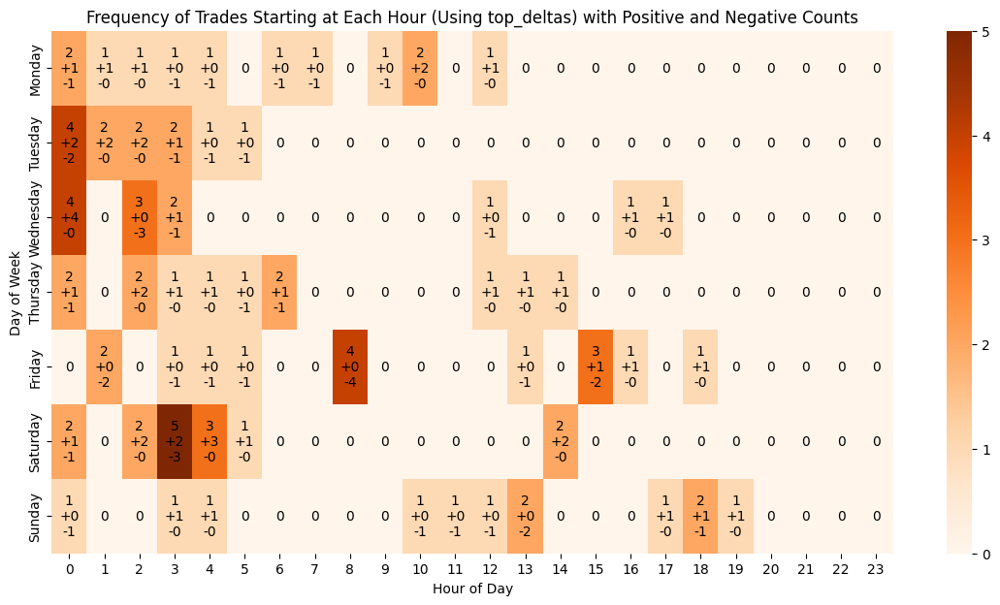

In [243]:
heatmap_top_deltas_df = pd.DataFrame(0, index=days_of_week, columns=np.arange(24))

for idx, row in top_deltas.iterrows():
    day_name = calendar.day_name[idx.weekday()]
    for hour in row[['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3']].values:
        heatmap_top_deltas_df.at[day_name, hour] += 1

plt.figure(figsize=(14, 7))
ax = sns.heatmap(heatmap_top_deltas_df, annot=True, fmt=".0f", cmap='Oranges', 
                 xticklabels=np.arange(24), yticklabels=days_of_week)

for i, j in itertools.product(range(heatmap_top_deltas_df.shape[0]), range(heatmap_top_deltas_df.shape[1])):
    text = ax.texts[i * heatmap_top_deltas_df.shape[1] + j]
    text.set_text(text.get_text() + f"\n+{positive_counts.iat[i, j]}\n-{negative_counts.iat[i, j]}")
    text.set_color('black')
    if "0\n+0\n-0" in text.get_text():
        text.set_text("0")

plt.title('Frequency of Trades Starting at Each Hour (Using top_deltas) with Positive and Negative Counts')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()

In [244]:
positive_avg_duration = {str(hour): 0 for hour in range(24)}
negative_avg_duration = {str(hour): 0 for hour in range(24)}

positive_counts = {str(hour): 0 for hour in range(24)}
negative_counts = {str(hour): 0 for hour in range(24)}

for idx, row in top_deltas.iterrows():
    for start_hour, end_hour, delta in zip(row[['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3']],
                                           row[['End_Hour_1', 'End_Hour_2', 'End_Hour_3']],
                                           row[['Max_Delta_1', 'Max_Delta_2', 'Max_Delta_3']]):
        start_hour = int(start_hour)
        end_hour = int(end_hour)
        
        if delta > 0:
            positive_avg_duration[str(start_hour)] += (end_hour - start_hour)
            positive_counts[str(start_hour)] += 1
        else:
            negative_avg_duration[str(start_hour)] += (end_hour - start_hour)
            negative_counts[str(start_hour)] += 1

for hour in range(24):
    hour_str = str(hour)
    if positive_counts[hour_str] != 0:
        positive_avg_duration[hour_str] /= positive_counts[hour_str]
    if negative_counts[hour_str] != 0:
        negative_avg_duration[hour_str] /= negative_counts[hour_str]

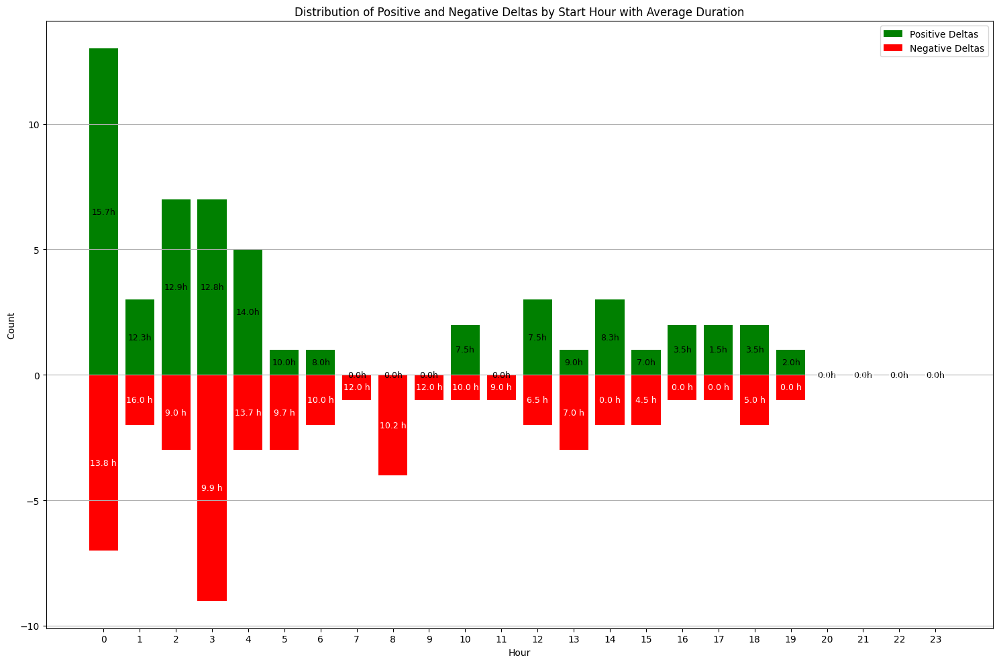

In [245]:
plt.figure(figsize=(15, 10))
bars_positive = plt.bar(start_hours_positive.index, start_hours_positive.values, label='Positive Deltas', color='green', bottom=0)
bars_negative = plt.bar(start_hours_negative.index, -start_hours_negative.values, label='Negative Deltas', color='red', bottom=0)

for hour, duration in positive_avg_duration.items():
    hour = int(hour) 
    height = bars_positive[hour].get_height()
    plt.text(hour, height/2, f"{duration:.1f}h", ha='center', va='center', fontsize=9, color='black')

for hour, duration in negative_avg_duration.items():
    hour = int(hour) 
    height = bars_negative[hour].get_height()
    plt.text(hour, height/2, f"{duration:.1f} h", ha='center', va='center', fontsize=9, color='white')

plt.xlabel('Hour')
plt.ylabel('Count')
plt.title('Distribution of Positive and Negative Deltas by Start Hour with Average Duration')
plt.xticks(np.arange(24))
plt.grid(axis='y')
plt.legend()
plt.tight_layout()

plt.show()

In [246]:
def compute_top_5_deltas_restructured(df_day):
    deltas = []

    for i, (index_i, row_i) in enumerate(df_day.iterrows()):
        cumulative_change = 0
        for j, (index_j, row_j) in enumerate(df_day.iloc[i:].iterrows()):
            cumulative_change += row_j['price_change']
            deltas.append((cumulative_change, index_i.hour, index_j.hour))
    
    sorted_deltas = sorted(deltas, key=lambda x: abs(x[0]), reverse=True)[:5]
    
    data = []
    for delta in sorted_deltas:
        data.extend([delta[1], delta[2], delta[0]])

    return pd.Series(data, index=['Start_Hour_1', 'End_Hour_1', 'Delta_1',
                                  'Start_Hour_2', 'End_Hour_2', 'Delta_2',
                                  'Start_Hour_3', 'End_Hour_3', 'Delta_3',
                                  'Start_Hour_4', 'End_Hour_4', 'Delta_4',
                                  'Start_Hour_5', 'End_Hour_5', 'Delta_5'])

top_5_deltas_restructured = df_z2.groupby([df_z2.index.isocalendar().week, df_z2.index.day_name()]).apply(compute_top_5_deltas_restructured)
top_5_deltas_restructured.head()

Start_Hour_1  End_Hour_1  Delta_1  Start_Hour_2  End_Hour_2   
week date                                                                    
35   Friday             4.0        17.0    -2.31          13.0        17.0  \
     Saturday           3.0        15.0     0.52           2.0        15.0   
     Sunday            17.0        20.0     0.78           3.0        20.0   
36   Friday             1.0        16.0    -2.16           1.0        18.0   
     Monday             4.0        21.0    -1.21           9.0        21.0   

               Delta_2  Start_Hour_3  End_Hour_3  Delta_3  Start_Hour_4   
week date                                                                 
35   Friday      -2.25           3.0        17.0    -2.22           1.0  \
     Saturday     0.47           5.0        15.0     0.45           9.0   
     Sunday       0.73           4.0        20.0     0.72           2.0   
36   Friday      -2.15           5.0        16.0    -2.11           5.0   
     Monday      -1.20           3.0        21.0    -1.19           5.0   

               End_Hour_4  Delta_4  Start_Hour_5  End_Hour_5  Delta_5  
week date                                                              
35   Friday          17.0    -2.19          12.0        17.0    -2.19  
     Saturday        15.0     0.44           3.0        23.0     0.42  
     Sunday          20.0     0.70           0.0        20.0     0.69  
36   Friday          18.0    -2.10           1.0        17.0    -2.03  
     Monday          21.0    -1.19           0.0        21.0    -1.15

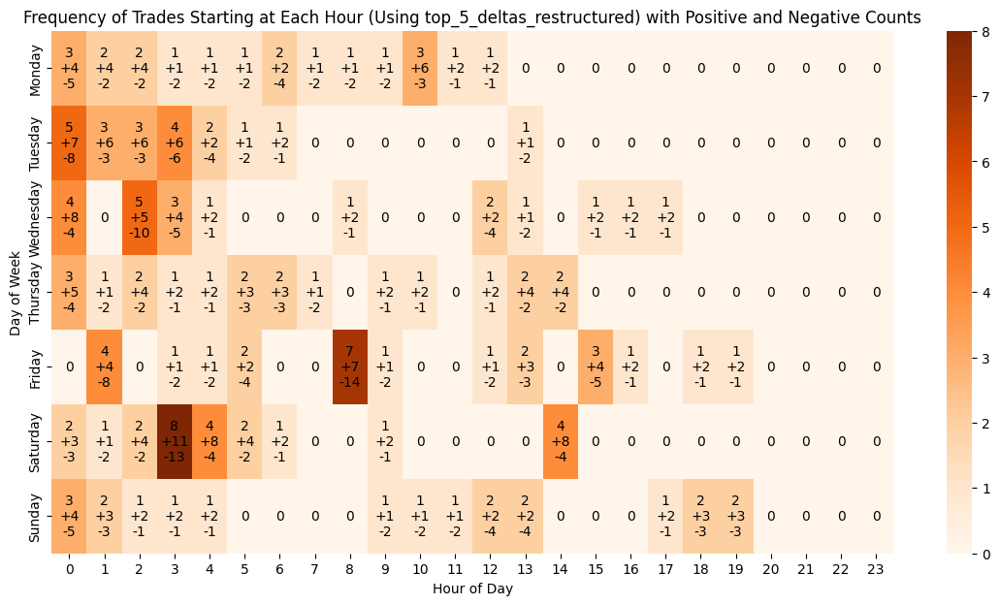

In [247]:
heatmap_df_restructured = pd.DataFrame(0, index=days_of_week, columns=np.arange(24))

for (week, day), row in top_5_deltas_restructured.iterrows():
    for hour in row[['Start_Hour_1', 'Start_Hour_2', 'Start_Hour_3', 'Start_Hour_4', 'Start_Hour_5']].values:
        heatmap_df_restructured.at[day, hour] += 1

positive_counts_restructured = heatmap_df_restructured.copy().astype(int)
negative_counts_restructured = heatmap_df_restructured.copy().astype(int)

for (week, day), row in top_5_deltas_restructured.iterrows():
    for i in range(1, 6):
        start_hour_col = f"Start_Hour_{i}"
        delta_col = f"Delta_{i}"
        start_hour = row[start_hour_col]
        delta = row[delta_col]
        
        if delta > 0:
            positive_counts_restructured.at[day, start_hour] += 1
        else:
            negative_counts_restructured.at[day, start_hour] += 1

plt.figure(figsize=(14, 7))
ax = sns.heatmap(heatmap_df_restructured, annot=True, fmt=".0f", cmap='Oranges', 
                 xticklabels=np.arange(24), yticklabels=days_of_week)

for i, j in itertools.product(range(heatmap_df_restructured.shape[0]), range(heatmap_df_restructured.shape[1])):
    text = ax.texts[i * heatmap_df_restructured.shape[1] + j]
    text.set_text(text.get_text() + f"\n+{positive_counts_restructured.iat[i, j]}\n-{negative_counts_restructured.iat[i, j]}")
    text.set_color('black')
    if "0\n+0\n-0" in text.get_text():
        text.set_text("0")

plt.title('Frequency of Trades Starting at Each Hour (Using top_5_deltas_restructured) with Positive and Negative Counts')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()

In [248]:
df_pw = df3.copy(deep=True)

In [249]:
df_ml = df_pw[df_pw['token'] == 'BTC']
df_ml.head()


,date,symbol,open,high,low,close,volume,tradecount,token,hour,day,month,week,year,volatility,hc_change,lc_change,price_change
317303,2017-08-17 04:00:00,BTCUSDT,4261.48,4313.62,4261.32,4308.83,202366,171,BTC,4,Thursday,8,33,2017,1.227319,-0.111044,1.114913,0.00
317304,2017-08-17 05:00:00,BTCUSDT,4308.83,4328.69,4291.37,4315.32,100305,102,BTC,5,Thursday,8,33,2017,0.869652,-0.308869,0.558097,0.15
317305,2017-08-17 06:00:00,BTCUSDT,4330.29,4345.45,4309.37,4324.35,31282,36,BTC,6,Thursday,8,33,2017,0.837245,-0.485565,0.347615,0.21
317306,2017-08-17 07:00:00,BTCUSDT,4316.62,4349.99,4287.41,4349.99,19241,25,BTC,7,Thursday,8,33,2017,1.459622,0.000000,1.459622,0.59
317307,2017-08-17 08:00:00,BTCUSDT,4333.32,4377.85,4333.32,4360.69,4240,28,BTC,8,Thursday,8,33,2017,1.027619,-0.391973,0.631617,0.25


In [250]:
df_ml = df_ml.drop(['symbol', 'token'], axis=1)

In [252]:
df_ml['WMA'] = wma(df_ml['close'], length=14)
df_ml['HMA'] = hma(df_ml['close'])
df_ml['KAMA'] = kama(df_ml['close'])
df_ml['CMO'] = cmo(df_ml['close'])

rolling_mean = df_ml['close'].rolling(window=12).mean()
rolling_std = df_ml['close'].rolling(window=12).std()
df_ml['Z-Score'] = (df_ml['close'] - rolling_mean) / rolling_std

In [253]:
nan_values = df_ml.isna()
any_missing_values = nan_values.any().any()

any_missing_values_in_column = nan_values.any()

missing_value_count = df_ml.isnull().sum()

for column, has_missing in any_missing_values_in_column.items():
    if has_missing:
        count = missing_value_count[column]
        print(f"-----> Column '{column}' has {count} missing values.")
        
print("\nMissing Values in the Entire DataFrame?")
print(any_missing_values)

print("\nMissing Values in Each Column?")
print(any_missing_values_in_column)

print("\nMissing Value Counts in Each Column:")
print(missing_value_count)

-----> Column 'WMA' has 13 missing values.
-----> Column 'HMA' has 11 missing values.
-----> Column 'KAMA' has 9 missing values.
-----> Column 'CMO' has 14 missing values.
-----> Column 'Z-Score' has 11 missing values.

Missing Values in the Entire DataFrame?
True

Missing Values in Each Column?
date            False
open            False
high            False
low             False
close           False
volume          False
tradecount      False
hour            False
day             False
month           False
week            False
year            False
volatility      False
hc_change       False
lc_change       False
price_change    False
WMA              True
HMA              True
KAMA             True
CMO              True
Z-Score          True
dtype: bool

Missing Value Counts in Each Column:
date             0
open             0
high             0
low              0
close            0
volume           0
tradecount       0
hour             0
day              0
month            0
w

In [254]:
df_ml['Z-Score'].bfill(inplace=True)
df_ml['CMO'].bfill(inplace=True)

In [256]:
indicators = ['WMA', 'HMA', 'KAMA', 'CMO', 'Z-Score']
df_indicators = df_ml[indicators].dropna()

vif_data = pd.DataFrame()
vif_data["Variable"] = df_indicators.columns
vif_data["VIF"] = [variance_inflation_factor(df_indicators.values, i) for i in range(df_indicators.shape[1])]

vif_data

,Variable,VIF
0,WMA,38858.911122
1,HMA,13234.362917
2,KAMA,31137.657450
3,CMO,2.551114
4,Z-Score,2.273004


In [257]:
df_ml = df_ml.drop(['WMA', 'HMA', 'KAMA'], axis=1)

In [258]:
df_ml.to_csv('ml_df.csv', index=False)